In [1]:
# =============================================================================
# CNN WIND SPEED FORECASTING — LAG LENGTH OPTIMISATION (1 to 14)
# =============================================================================
# Univariate wind speed forecasting (WS10M) using a 1D Convolutional Neural
# Network (CNN). The optimal sliding window (lag) length (1–14) is identified
# jointly with model hyperparameters under four strategies:
#
#   1. Original Model    (manual hyperparameters — tested across lags 1–14)
#   2. Grid Search       (exhaustive grid over hyperparams × lags 1–14)
#   3. Randomized Search (random sampling over hyperparams × lags 1–14)
#   4. Optuna            (Bayesian optimisation over hyperparams + lag)
#
# Data split  : 80 % train | 20 % test (chronological, no shuffling).
# CV strategy : TimeSeriesSplit applied exclusively on the training set.
# The test set is used ONLY for final evaluation — never during tuning.
#
# *** DATA LEAKAGE FIX (applies to all original files) ***
# All three originals applied MinMaxScaler.fit_transform() to the ENTIRE
# series before the train/test split. This leaks test-set statistics into
# the training transform and would be grounds for rejection. Fixed here:
# the scaler is fit only on the training portion for every lag iteration.
# =============================================================================


In [2]:
# ─────────────────────────────────────────────────────────────────────────────
# SECTION 1: PACKAGE INSTALLATION
# ─────────────────────────────────────────────────────────────────────────────

!pip install optuna
# pip install tensorflow
# pip install scikit-learn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 413.9/413.9 kB 4.4 MB/s eta 0:00:00


In [3]:
# ─────────────────────────────────────────────────────────────────────────────
# SECTION 2: IMPORT LIBRARIES
# ─────────────────────────────────────────────────────────────────────────────

# Standard libraries
import random
import warnings
from itertools import product
warnings.filterwarnings("ignore")

# Data manipulation
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter

# TensorFlow / Keras
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Flatten
from tensorflow.keras.optimizers import Adam

# Scikit-learn
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Optuna for Bayesian optimisation
import optuna
from optuna.samplers import TPESampler
optuna.logging.set_verbosity(optuna.logging.WARNING)   # Suppress verbose output

In [4]:


# ─────────────────────────────────────────────────────────────────────────────
# SECTION 3: REPRODUCIBILITY SEEDS
# ─────────────────────────────────────────────────────────────────────────────

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# ─────────────────────────────────────────────────────────────────────────────
# SECTION 4: LOAD DATASET
# ─────────────────────────────────────────────────────────────────────────────

# Dataset source (Google Sheets exported as CSV):
# https://docs.google.com/spreadsheets/d/1j_Euo80PrGckVDVr2hTG9zZebxJD0TSC

sheet_id   = "1j_Euo80PrGckVDVr2hTG9zZebxJD0TSC"
sheet_name = "Sheet1"
csv_url    = (
    f"https://docs.google.com/spreadsheets/d/{sheet_id}"
    f"/gviz/tq?tqx=out:csv&sheet={sheet_name}"
)

# Read the Google Sheet as CSV
df_raw = pd.read_csv(csv_url)

# Backup original DataFrame before any modifications
df_backup = df_raw.copy()

# Set Date as the index and convert to datetime for proper date-axis plotting
df_raw = df_raw.set_index('Date')
df_raw.index = pd.to_datetime(df_raw.index)

# Drop calendar columns (YEAR, MO, DY) — not needed as model features
df_raw = df_raw.drop(columns=["YEAR", "MO", "DY"])

# Keep only the target variable: Wind Speed at 10 metres (WS10M)
df_raw = df_raw[["WS10M"]].astype(float)

# Store the raw (unscaled) series for use in the data preparation function
raw_series = df_raw["WS10M"].values
raw_index  = df_raw.index

print("Dataset loaded. Shape:", df_raw.shape)
print(df_raw.head())


Dataset loaded. Shape: (4017, 1)
            WS10M
Date             
2013-01-01   3.99
2013-01-02   4.25
2013-01-03   4.75
2013-01-04   5.74
2013-01-05   5.79


In [5]:
# ─────────────────────────────────────────────────────────────────────────────
# SECTION 5: SHARED HELPER FUNCTIONS
# ─────────────────────────────────────────────────────────────────────────────

def create_sequences(data, window_size):
    """
    Convert a 1-D time series into supervised learning sequences.

    Parameters:
        data        : 1-D numpy array of target values (RAW, unscaled)
        window_size : int, number of past time steps used as input (= lag)

    Returns:
        X : array of shape (n_samples, window_size)
        y : array of shape (n_samples,)
    """
    X, y = [], []
    for i in range(len(data) - window_size):
        X.append(data[i:i + window_size])
        y.append(data[i + window_size])
    return np.array(X), np.array(y)


def prepare_lag_data(lag):
    """
    Build sliding-window sequences from the RAW series, split 80/20
    chronologically, fit a MinMaxScaler on the training portion only,
    and reshape for CNN input.

    NOTE: The scaler is fit ONLY on the training target values and then
    applied to the test set. Fitting on the full series before splitting
    would leak test-set statistics into training — corrected here.

    Parameters:
        lag : int, sliding window / lag length

    Returns:
        X_train_cnn    : numpy array, shape (n_train, lag, 1)
        X_test_cnn     : numpy array, shape (n_test,  lag, 1)
        y_train_scaled : numpy array, scaled training target (flat)
        y_test_scaled  : numpy array, scaled test target (flat)
        y_test_inv     : numpy array, test target in original scale
        test_dates     : DatetimeIndex, dates of test observations
        scaler         : fitted MinMaxScaler for inverse transform
    """
    # Build raw sequences
    X_raw, y_raw = create_sequences(raw_series, lag)

    # Corresponding dates for the test set (offset by window_size)
    seq_dates  = raw_index[lag:]
    split_idx  = int(len(X_raw) * 0.8)    # 80 % training

    X_train_raw, X_test_raw = X_raw[:split_idx], X_raw[split_idx:]
    y_train_raw, y_test_raw = y_raw[:split_idx], y_raw[split_idx:]
    test_dates              = seq_dates[split_idx:]

    # Fit scaler on TRAINING values only, then transform both sets
    scaler = MinMaxScaler()
    y_train_scaled = scaler.fit_transform(
        y_train_raw.reshape(-1, 1)
    ).flatten()
    y_test_scaled  = scaler.transform(
        y_test_raw.reshape(-1, 1)
    ).flatten()

    # Scale input windows using the same scaler
    X_train_scaled = scaler.transform(
        X_train_raw.reshape(-1, 1)
    ).reshape(X_train_raw.shape)
    X_test_scaled  = scaler.transform(
        X_test_raw.reshape(-1, 1)
    ).reshape(X_test_raw.shape)

    # Inverse-scale the test target for metric computation
    y_test_inv = scaler.inverse_transform(
        y_test_scaled.reshape(-1, 1)
    ).flatten()

    # Reshape for CNN input: (samples, time steps, features=1)
    X_train_cnn = X_train_scaled[..., np.newaxis]
    X_test_cnn  = X_test_scaled[...,  np.newaxis]

    return (X_train_cnn, X_test_cnn,
            y_train_scaled, y_test_scaled,
            y_test_inv, test_dates, scaler)


def build_cnn(filters, kernel_size, lr, input_shape):
    """
    Build and compile a single-layer 1D CNN for regression.

    Parameters:
        filters      : int,   number of convolutional filters
        kernel_size  : int,   size of the convolutional kernel
        lr           : float, Adam learning rate
        input_shape  : tuple, (time steps, features)

    Returns:
        compiled Keras Sequential model
    """
    tf.keras.backend.clear_session()
    model = Sequential([
        Conv1D(filters=filters, kernel_size=kernel_size,
               activation='relu', input_shape=input_shape),
        Flatten(),
        Dense(1)
    ])
    model.compile(optimizer=Adam(learning_rate=lr), loss='mse')
    return model


def cross_validate_cnn(filters, kernel_size, lr, batch_size, epochs,
                        X_train_cnn, y_train_scaled, n_splits=3):
    """
    Evaluate a CNN configuration using TimeSeriesSplit CV on training data.
    Returns mean validation MSE across folds, or infinity on error.
    The test set is never accessed here.

    Parameters:
        filters, kernel_size, lr : CNN hyperparameters
        batch_size, epochs       : training hyperparameters
        X_train_cnn              : numpy array, (n_train, lag, 1)
        y_train_scaled           : numpy array, scaled training target
        n_splits                 : int, number of TimeSeriesSplit folds

    Returns:
        float, mean validation MSE (lower is better)
    """
    tscv       = TimeSeriesSplit(n_splits=n_splits)
    val_losses = []

    try:
        for train_idx, val_idx in tscv.split(X_train_cnn):
            X_t, X_v = X_train_cnn[train_idx], X_train_cnn[val_idx]
            y_t, y_v = y_train_scaled[train_idx], y_train_scaled[val_idx]

            model = build_cnn(filters, kernel_size, lr,
                              input_shape=X_t.shape[1:])
            model.fit(X_t, y_t, epochs=epochs,
                      batch_size=batch_size, verbose=0)
            val_losses.append(model.evaluate(X_v, y_v, verbose=0))

    except Exception as e:
        print(f"    Skipping — error: {e}")
        return float('inf')

    return np.mean(val_losses)


def compute_metrics(y_true, y_pred):
    """
    Compute MSE, RMSE, MAE, MAPE, and R² for a set of predictions.

    Parameters:
        y_true : array-like, actual values (original scale)
        y_pred : array-like, predicted values (original scale)

    Returns:
        dict with keys: mse, rmse, mae, mape, r2
    """
    y_true = np.array(y_true).flatten()
    y_pred = np.array(y_pred).flatten()

    mse  = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae  = mean_absolute_error(y_true, y_pred)
    # Small epsilon prevents division by zero in MAPE
    mape = np.mean(np.abs((y_true - y_pred) / (np.abs(y_true) + 1e-8))) * 100
    r2   = r2_score(y_true, y_pred)

    return dict(mse=mse, rmse=rmse, mae=mae, mape=mape, r2=r2)


def print_metrics(metrics, label):
    """Print a formatted metrics report."""
    print(f"\n{'*' * 55}")
    print(f"  {label}")
    print(f"{'*' * 55}")
    print(f"  MSE       : {metrics['mse']:.6f}")
    print(f"  RMSE      : {metrics['rmse']:.6f}")
    print(f"  MAE       : {metrics['mae']:.6f}")
    print(f"  MAPE      : {metrics['mape']:.6f} %")
    print(f"  R-squared : {metrics['r2']:.6f}")
    print(f"{'*' * 55}")


def print_optimal_model_box(method_name, optimal_lag, best_params, metrics):
    """
    Print a clearly formatted box summarising the optimal model found
    by a given hyperparameter tuning method.

    Parameters:
        method_name : str,  e.g. 'Original Model', 'Grid Search'
        optimal_lag : int,  best lag length identified
        best_params : dict, hyperparameters of the optimal model
        metrics     : dict, keys mse / rmse / mae / mape / r2
    """
    border = "█" * 65
    print(f"\n{border}")
    print(f"  ✦  OPTIMAL MODEL SUMMARY — {method_name.upper()}")
    print(border)
    print(f"  Optimal Lag (Window Size) : {optimal_lag}")
    print(f"  {'─' * 61}")
    print(f"  Hyperparameters:")
    for k, v in best_params.items():
        print(f"    {k:<22} : {v}")
    print(f"  {'─' * 61}")
    print(f"  Test Set Performance:")
    print(f"    {'MSE':<22} : {metrics['mse']:.6f}")
    print(f"    {'RMSE':<22} : {metrics['rmse']:.6f}")
    print(f"    {'MAE':<22} : {metrics['mae']:.6f}")
    print(f"    {'MAPE':<22} : {metrics['mape']:.6f} %")
    print(f"    {'R-squared':<22} : {metrics['r2']:.6f}")
    print(f"{border}\n")


def plot_predictions(test_dates, y_true, y_pred, title):
    """
    Plot actual vs predicted wind speed values against date.

    Parameters:
        test_dates : DatetimeIndex
        y_true     : array-like, actual values
        y_pred     : array-like, predicted values
        title      : str, plot title
    """
    plt.figure(figsize=(14, 6))
    plt.plot(test_dates, y_true, label="Actual",    linewidth=2,   linestyle="-")
    plt.plot(test_dates, y_pred, label="Predicted", linewidth=1.5, linestyle="--")
    plt.title(title, fontsize=14)
    plt.xlabel("Date", fontsize=12)
    plt.ylabel("Wind Speed (WS10M)", fontsize=12)
    plt.gca().xaxis.set_major_formatter(DateFormatter("%Y-%m"))
    plt.gcf().autofmt_xdate()
    plt.legend(fontsize=12)
    plt.grid(linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()



SECTION 6: ORIGINAL CNN MODEL  (No Hyperparameter Tuning)

  Original CNN — Lag 1

*******************************************************
  Original CNN — Lag 1
*******************************************************
  MSE       : 0.769115
  RMSE      : 0.876992
  MAE       : 0.671217
  MAPE      : 18.815654 %
  R-squared : 0.680686
*******************************************************


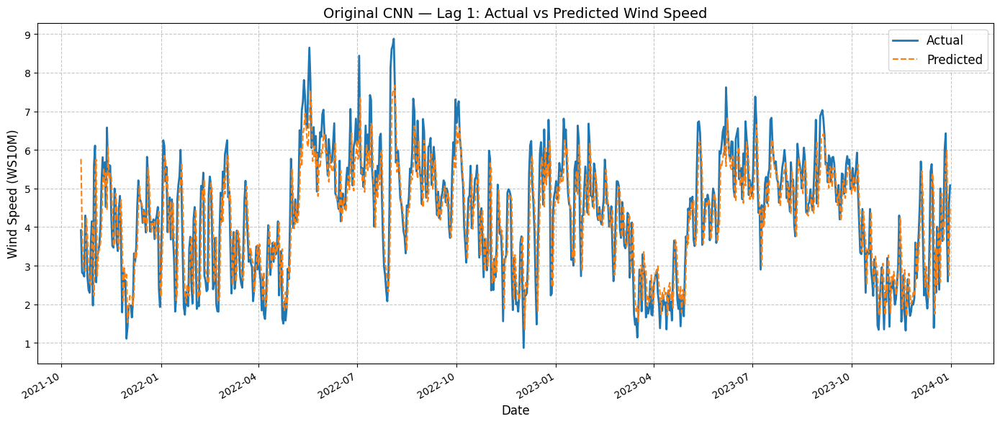


  Original CNN — Lag 2

*******************************************************
  Original CNN — Lag 2
*******************************************************
  MSE       : 0.788292
  RMSE      : 0.887858
  MAE       : 0.682725
  MAPE      : 18.770777 %
  R-squared : 0.673103
*******************************************************


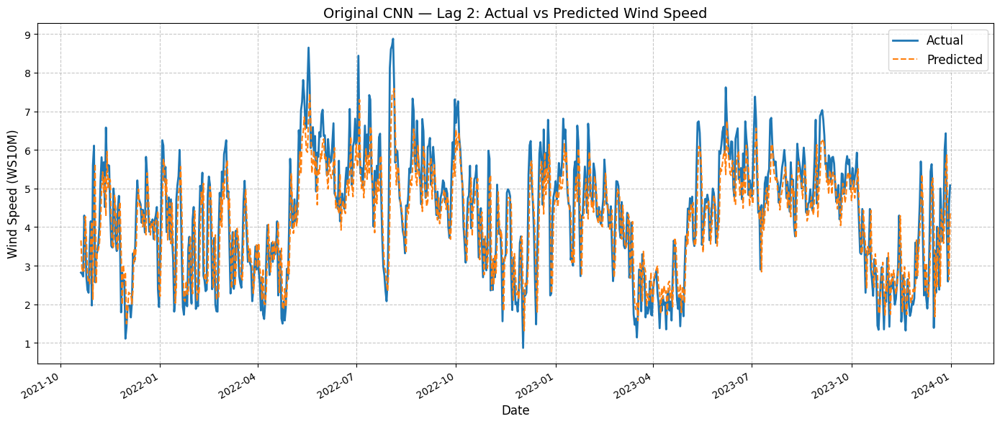


  Original CNN — Lag 3

*******************************************************
  Original CNN — Lag 3
*******************************************************
  MSE       : 0.753748
  RMSE      : 0.868187
  MAE       : 0.665997
  MAPE      : 18.906383 %
  R-squared : 0.687429
*******************************************************


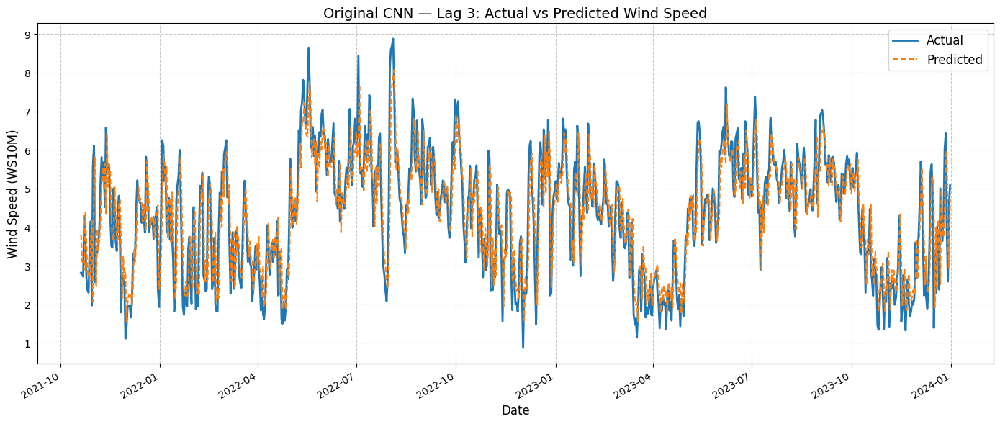


  Original CNN — Lag 4

*******************************************************
  Original CNN — Lag 4
*******************************************************
  MSE       : 0.755354
  RMSE      : 0.869111
  MAE       : 0.668243
  MAPE      : 18.773580 %
  R-squared : 0.686763
*******************************************************


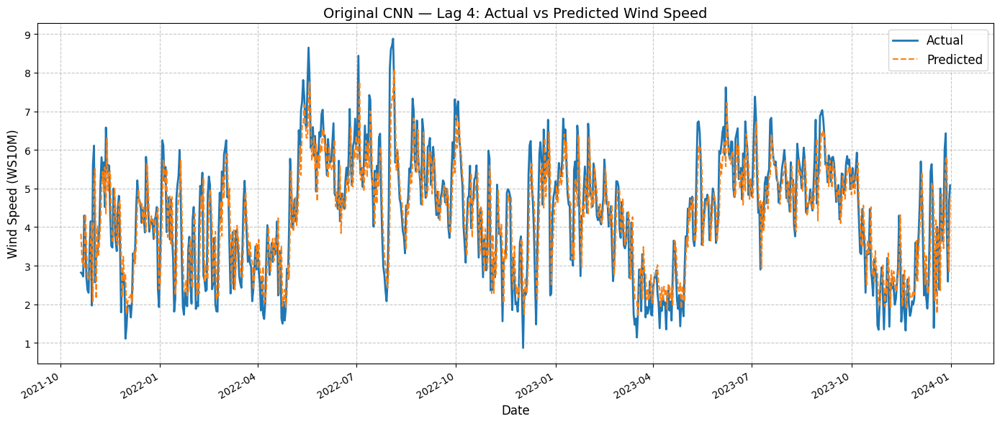


  Original CNN — Lag 5

*******************************************************
  Original CNN — Lag 5
*******************************************************
  MSE       : 0.748652
  RMSE      : 0.865247
  MAE       : 0.663848
  MAPE      : 18.776810 %
  R-squared : 0.689542
*******************************************************


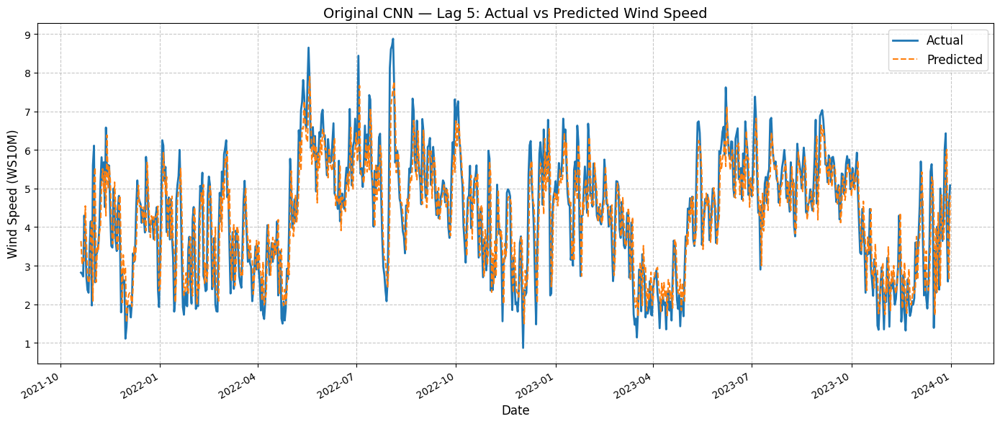


  Original CNN — Lag 6

*******************************************************
  Original CNN — Lag 6
*******************************************************
  MSE       : 0.757574
  RMSE      : 0.870387
  MAE       : 0.665582
  MAPE      : 18.403292 %
  R-squared : 0.685842
*******************************************************


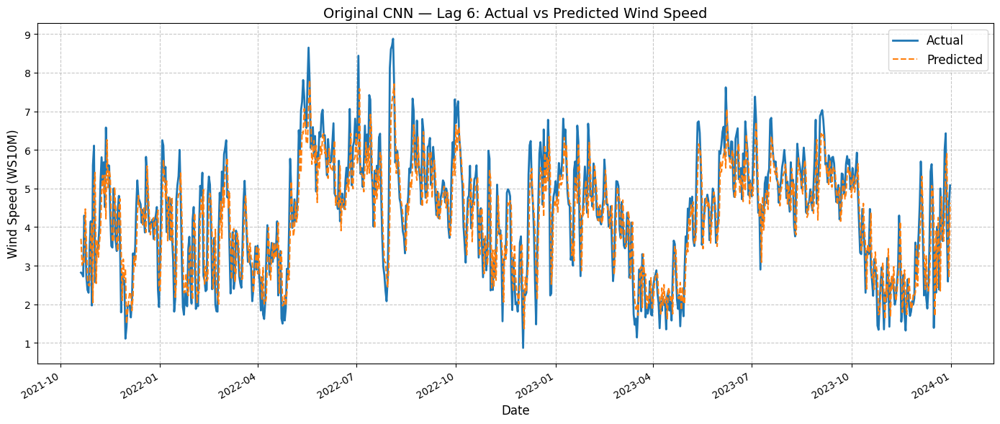


  Original CNN — Lag 7

*******************************************************
  Original CNN — Lag 7
*******************************************************
  MSE       : 0.736834
  RMSE      : 0.858391
  MAE       : 0.662518
  MAPE      : 18.754305 %
  R-squared : 0.694465
*******************************************************


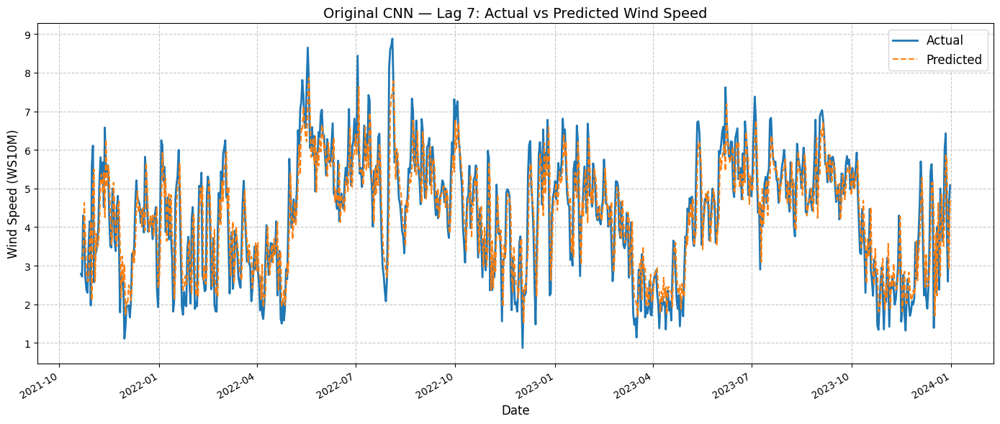


  Original CNN — Lag 8

*******************************************************
  Original CNN — Lag 8
*******************************************************
  MSE       : 0.746013
  RMSE      : 0.863720
  MAE       : 0.668160
  MAPE      : 19.171433 %
  R-squared : 0.690660
*******************************************************


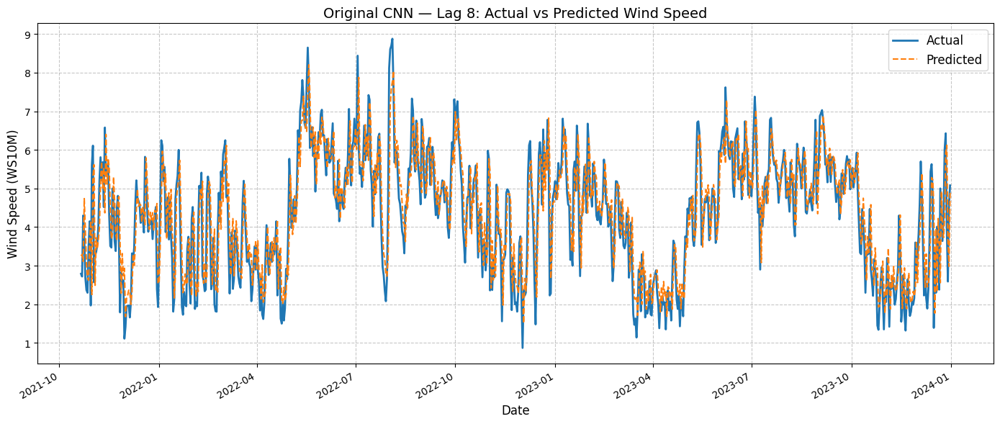


  Original CNN — Lag 9

*******************************************************
  Original CNN — Lag 9
*******************************************************
  MSE       : 0.746528
  RMSE      : 0.864019
  MAE       : 0.667213
  MAPE      : 19.161669 %
  R-squared : 0.690446
*******************************************************


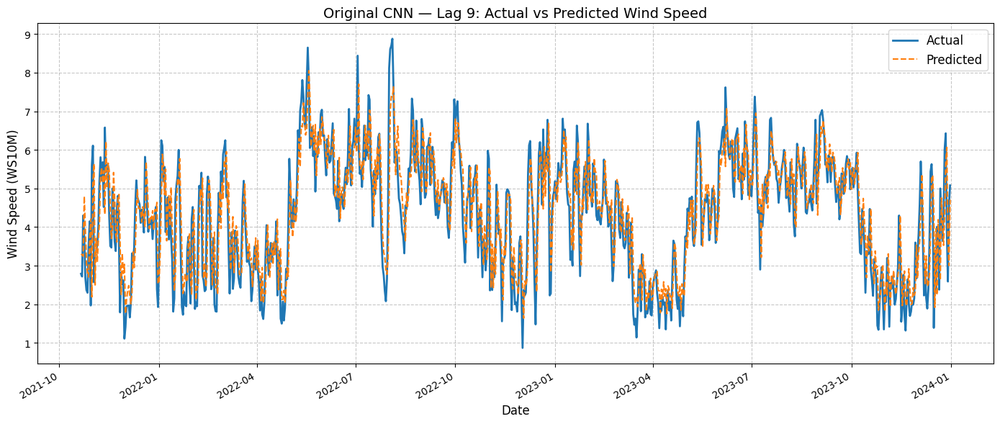


  Original CNN — Lag 10

*******************************************************
  Original CNN — Lag 10
*******************************************************
  MSE       : 0.740115
  RMSE      : 0.860299
  MAE       : 0.658739
  MAPE      : 18.160951 %
  R-squared : 0.693105
*******************************************************


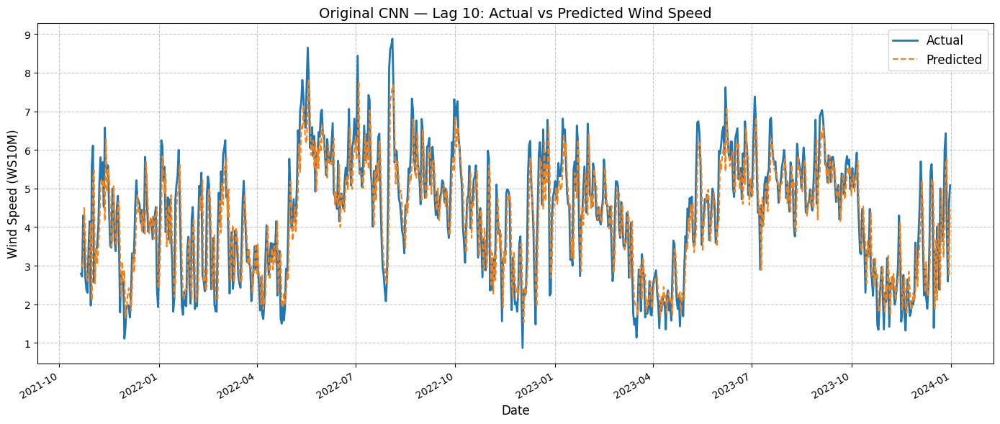


  Original CNN — Lag 11

*******************************************************
  Original CNN — Lag 11
*******************************************************
  MSE       : 0.743069
  RMSE      : 0.862015
  MAE       : 0.665295
  MAPE      : 19.252253 %
  R-squared : 0.691880
*******************************************************


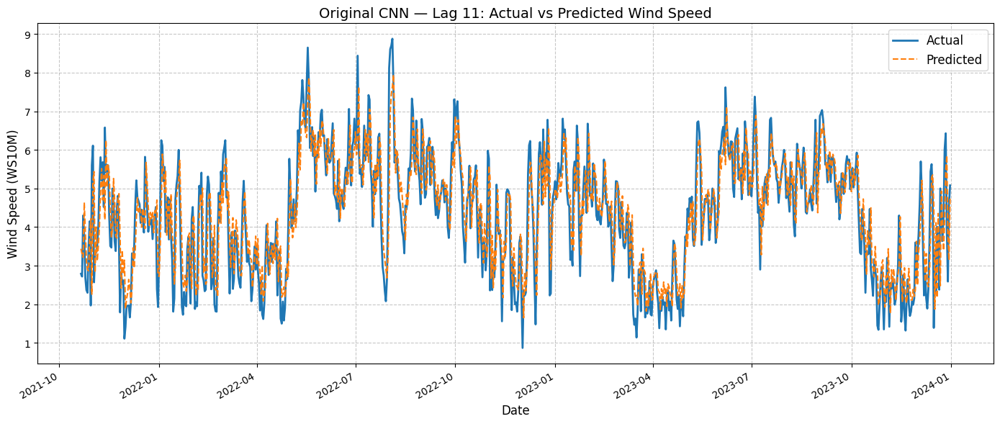


  Original CNN — Lag 12

*******************************************************
  Original CNN — Lag 12
*******************************************************
  MSE       : 0.783970
  RMSE      : 0.885421
  MAE       : 0.688565
  MAPE      : 20.246576 %
  R-squared : 0.674928
*******************************************************


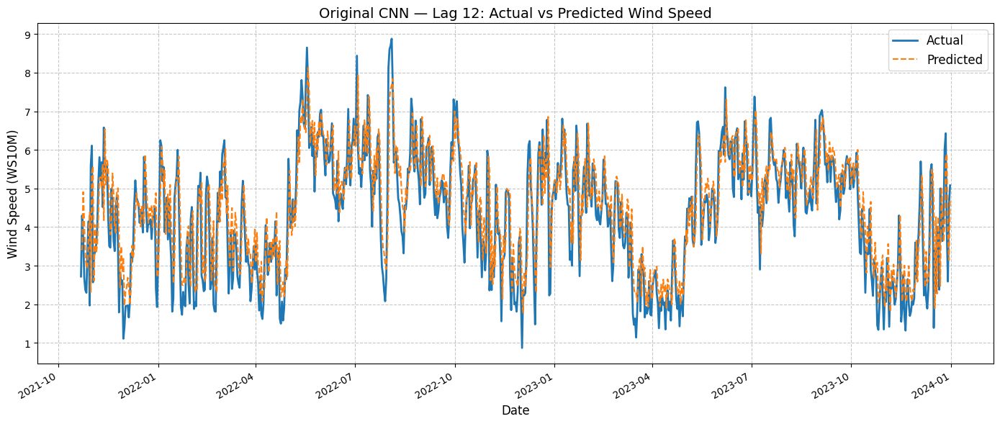


  Original CNN — Lag 13

*******************************************************
  Original CNN — Lag 13
*******************************************************
  MSE       : 0.775114
  RMSE      : 0.880405
  MAE       : 0.680422
  MAPE      : 19.900005 %
  R-squared : 0.678601
*******************************************************


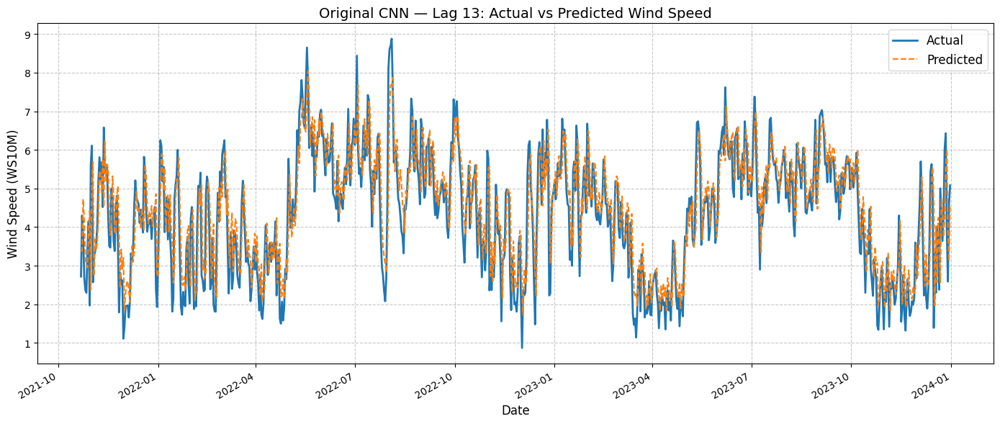


  Original CNN — Lag 14

*******************************************************
  Original CNN — Lag 14
*******************************************************
  MSE       : 0.767743
  RMSE      : 0.876210
  MAE       : 0.677457
  MAPE      : 19.953835 %
  R-squared : 0.681657
*******************************************************


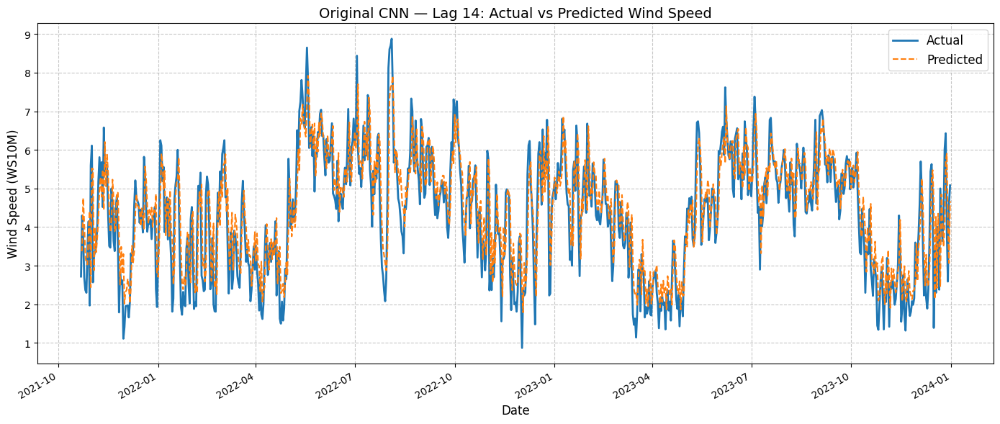


ORIGINAL CNN — SUMMARY ACROSS ALL LAGS
          mse      rmse       mae       mape        r2
lag                                                   
1    0.769115  0.876992  0.671217  18.815654  0.680686
2    0.788292  0.887858  0.682725  18.770777  0.673103
3    0.753748  0.868187  0.665997  18.906383  0.687429
4    0.755354  0.869111  0.668243  18.773580  0.686763
5    0.748652  0.865247  0.663848  18.776810  0.689542
6    0.757574  0.870387  0.665582  18.403292  0.685842
7    0.736834  0.858391  0.662518  18.754305  0.694465
8    0.746013  0.863720  0.668160  19.171433  0.690660
9    0.746528  0.864019  0.667213  19.161669  0.690446
10   0.740115  0.860299  0.658739  18.160951  0.693105
11   0.743069  0.862015  0.665295  19.252253  0.691880
12   0.783970  0.885421  0.688565  20.246576  0.674928
13   0.775114  0.880405  0.680422  19.900005  0.678601
14   0.767743  0.876210  0.677457  19.953835  0.681657

█████████████████████████████████████████████████████████████████
  ✦  OPTIMAL 

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# SECTION 6: ORIGINAL CNN MODEL (Manual Hyperparameters, Lags 1–14)
# ─────────────────────────────────────────────────────────────────────────────
# Fixed hyperparameters are used across all lag lengths. The lag that produces
# the lowest test RMSE is selected as the optimal window size.

print("\n" + "=" * 70)
print("SECTION 6: ORIGINAL CNN MODEL  (No Hyperparameter Tuning)")
print("=" * 70)

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Fixed hyperparameters for the baseline CNN
ORIG_PARAMS = {
    'filters':     64,
    'kernel_size': 2,
    'lr':          1e-3,
    'batch_size':  16,
    'epochs':      30,
}

orig_results = []

for lag in range(1, 15):
    print(f"\n{'=' * 50}")
    print(f"  Original CNN — Lag {lag}")
    print(f"{'=' * 50}")

    (X_train_cnn, X_test_cnn,
     y_train_scaled, y_test_scaled,
     y_test_inv, test_dates, scaler) = prepare_lag_data(lag)

    # Adjust kernel_size if it exceeds the lag (sequence length)
    ks = min(ORIG_PARAMS['kernel_size'], lag)

    # Train on the full training set with fixed parameters
    model_orig = build_cnn(
        ORIG_PARAMS['filters'], ks,
        ORIG_PARAMS['lr'], input_shape=X_train_cnn.shape[1:]
    )
    model_orig.fit(
        X_train_cnn, y_train_scaled,
        epochs     = ORIG_PARAMS['epochs'],
        batch_size = ORIG_PARAMS['batch_size'],
        verbose    = 0
    )

    # Predict and inverse scale
    y_pred_scaled = model_orig.predict(X_test_cnn, verbose=0).flatten()
    y_pred_inv    = scaler.inverse_transform(
        y_pred_scaled.reshape(-1, 1)
    ).flatten()

    # Compute and print per-lag metrics
    m = compute_metrics(y_test_inv, y_pred_inv)
    print_metrics(m, f"Original CNN — Lag {lag}")

    # Plot actual vs predicted with date axis
    plot_predictions(
        test_dates, y_test_inv, y_pred_inv,
        title=f"Original CNN — Lag {lag}: Actual vs Predicted Wind Speed"
    )

    orig_results.append({'lag': lag, **m})

# Identify optimal lag for the original model
orig_summary  = pd.DataFrame(orig_results).set_index('lag')
best_orig_lag = orig_summary['rmse'].idxmin()
best_orig_row = orig_summary.loc[best_orig_lag].to_dict()

print("\n" + "=" * 70)
print("ORIGINAL CNN — SUMMARY ACROSS ALL LAGS")
print("=" * 70)
print(orig_summary.round(6))

# ── Optimal model box ────────────────────────────────────────────────────────
print_optimal_model_box(
    method_name = "Original CNN",
    optimal_lag = best_orig_lag,
    best_params = ORIG_PARAMS,
    metrics     = best_orig_row
)


SECTION 7: GRID SEARCH HYPERPARAMETER TUNING

  Grid Search — Lag 1
  Testing 4 parameter combinations for lag 1
  Combination 1/4: filters=32, kernel=1, lr=0.001, epochs=20, batch=32
  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0087 | Params: {'filters': 64, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  Best Parameters (Lag 1): {'filters': 64, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}
  Best Validation MSE        : 0.0087

*******************************************************
  Grid Search CNN — Lag 1
*******************************************************
  MSE       : 0.769021
  RMSE      : 0.876938
  MAE       : 0.670340
  MAPE      : 18.819528 %
  R-squared : 0.680725
*******************************************************


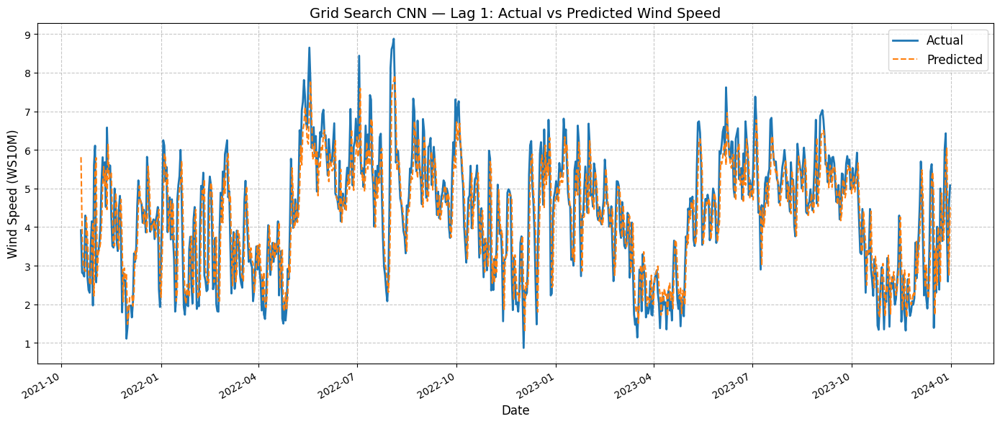


  Grid Search — Lag 2
  Testing 8 parameter combinations for lag 2
  Combination 1/8: filters=32, kernel=1, lr=0.001, epochs=20, batch=32
  New best — Val MSE: 0.0090 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0088 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0087 | Params: {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  Best Parameters (Lag 2): {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}
  Best Validation MSE        : 0.0087

*******************************************************
  Grid Search CNN — Lag 2
*******************************************************
  MSE       : 0.783614
  RMSE      : 0.885219
  MAE       : 0.678958
  MAPE      : 18.643154 %
  R-squ

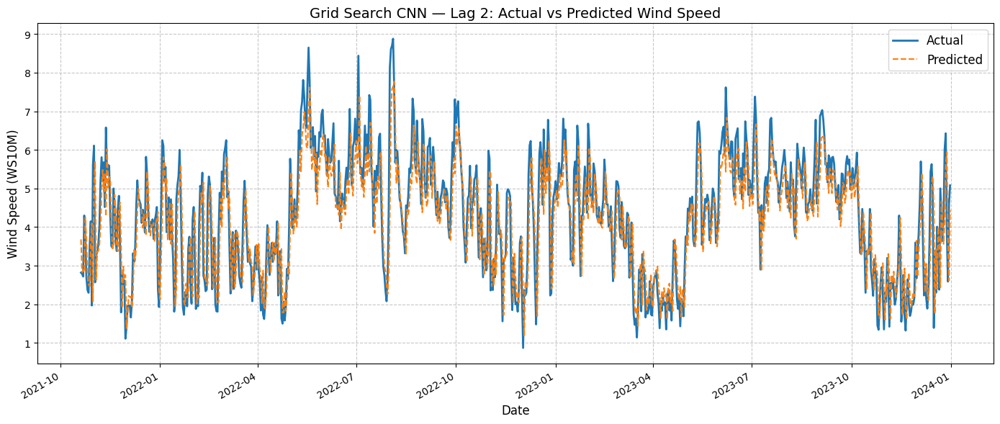


  Grid Search — Lag 3
  Testing 8 parameter combinations for lag 3
  Combination 1/8: filters=32, kernel=1, lr=0.001, epochs=20, batch=32
  New best — Val MSE: 0.0096 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0086 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0086 | Params: {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  Best Parameters (Lag 3): {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}
  Best Validation MSE        : 0.0086

*******************************************************
  Grid Search CNN — Lag 3
*******************************************************
  MSE       : 0.755323
  RMSE      : 0.869093
  MAE       : 0.666443
  MAPE      : 18.707340 %
  R-squ

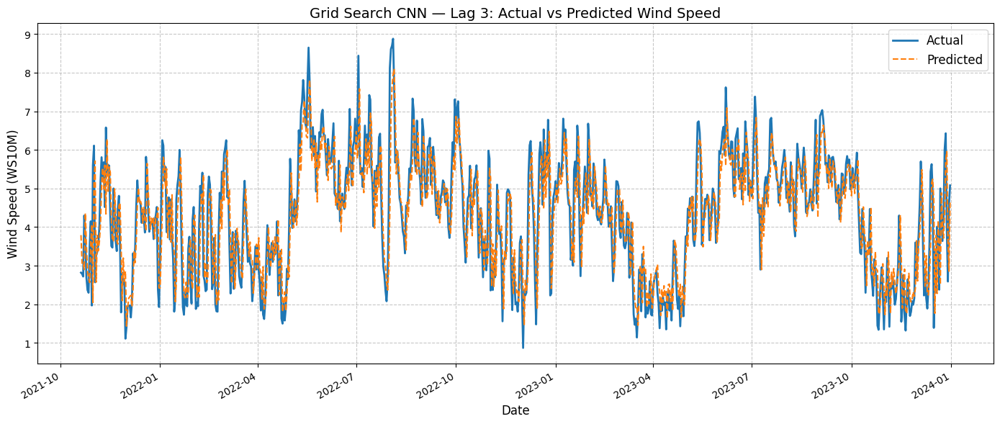


  Grid Search — Lag 4
  Testing 8 parameter combinations for lag 4
  Combination 1/8: filters=32, kernel=1, lr=0.001, epochs=20, batch=32
  New best — Val MSE: 0.0090 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0089 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0087 | Params: {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  Best Parameters (Lag 4): {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}
  Best Validation MSE        : 0.0087

*******************************************************
  Grid Search CNN — Lag 4
*******************************************************
  MSE       : 0.758398
  RMSE      : 0.870861
  MAE       : 0.671104
  MAPE      : 19.262045 %
  R-squ

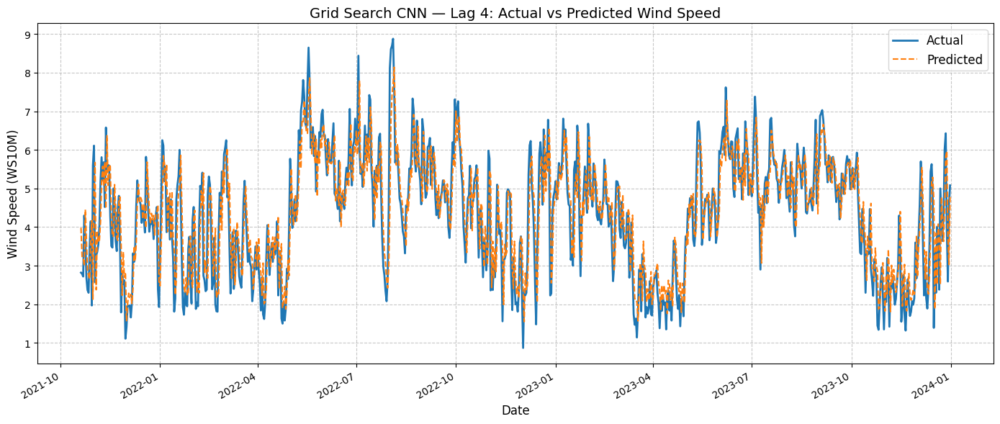


  Grid Search — Lag 5
  Testing 8 parameter combinations for lag 5
  Combination 1/8: filters=32, kernel=1, lr=0.001, epochs=20, batch=32
  New best — Val MSE: 0.0095 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0086 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0086 | Params: {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  Best Parameters (Lag 5): {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}
  Best Validation MSE        : 0.0086

*******************************************************
  Grid Search CNN — Lag 5
***************************************

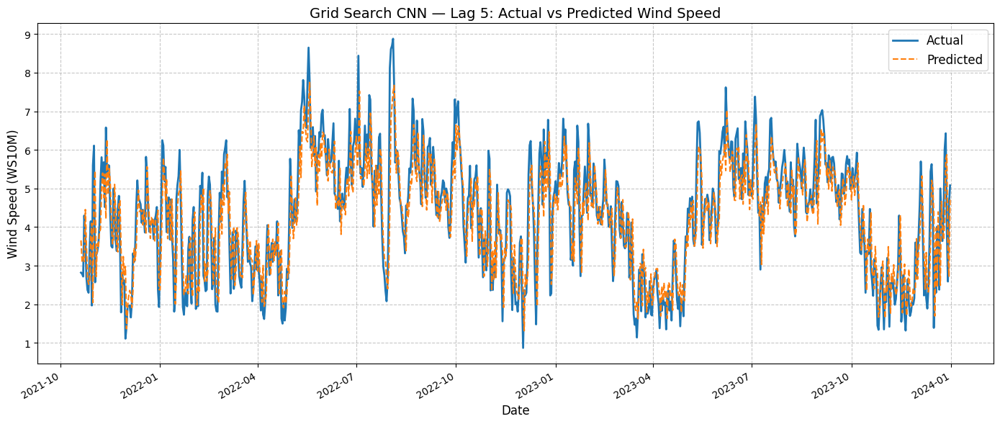


  Grid Search — Lag 6
  Testing 8 parameter combinations for lag 6
  Combination 1/8: filters=32, kernel=1, lr=0.001, epochs=20, batch=32
  New best — Val MSE: 0.0091 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}

  Best Parameters (Lag 6): {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}
  Best Validation MSE        : 0.0087

*******************************************************
  Grid Search CNN — Lag 6
*******************************************************
  MSE       : 0.757136
  RMSE      : 0.870136
  MAE       : 0.665075
  MAPE      : 18.235011 %
  R-squared : 0.686024
*******************************************************


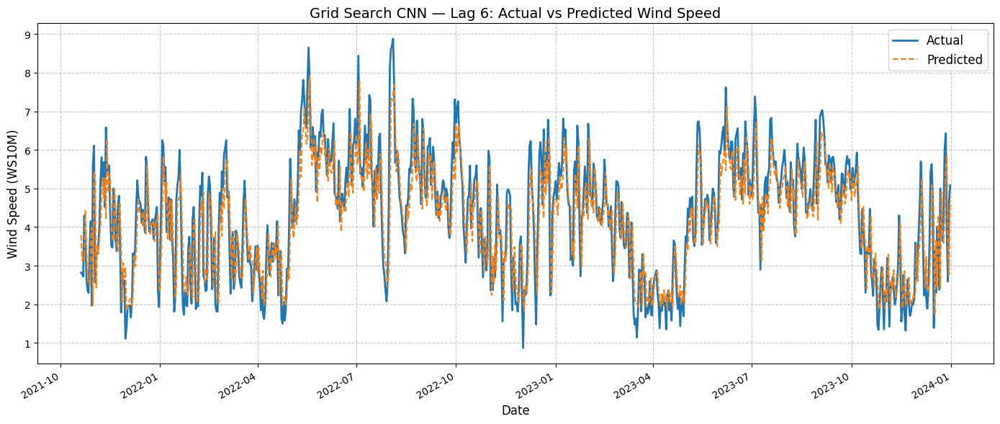


  Grid Search — Lag 7
  Testing 8 parameter combinations for lag 7
  Combination 1/8: filters=32, kernel=1, lr=0.001, epochs=20, batch=32
  New best — Val MSE: 0.0091 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0088 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  Best Parameters (Lag 7): {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}
  Best Validation MSE        : 0.0087

*******************************************************
  Grid Search CNN — Lag 7
*******************************************************
  MSE       : 0.746766
  RMSE      : 0.864156
  MAE       : 0.666918
  MAPE      : 19.368215 %
  R-squared : 0.690347
*******************************************************


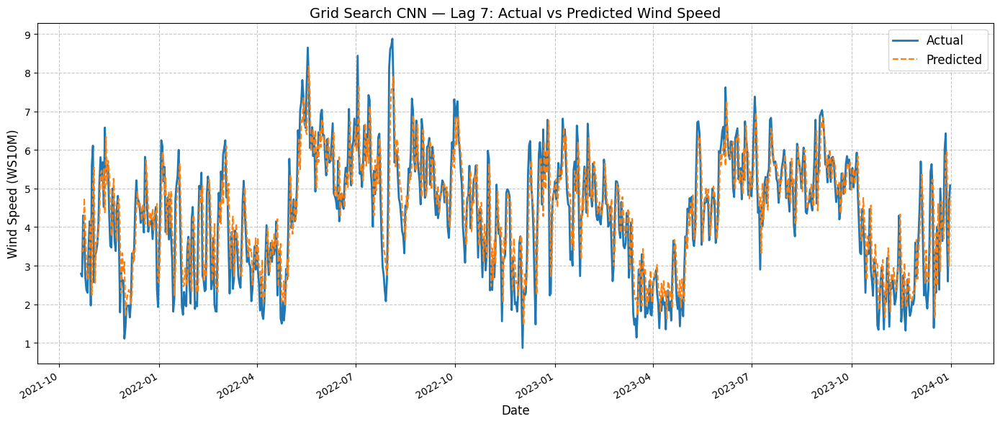


  Grid Search — Lag 8
  Testing 8 parameter combinations for lag 8
  Combination 1/8: filters=32, kernel=1, lr=0.001, epochs=20, batch=32
  New best — Val MSE: 0.0092 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0088 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0086 | Params: {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  Best Parameters (Lag 8): {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}
  Best Validation MSE        : 0.0086

*******************************************************
  Grid Search CNN — Lag 8
*******************************************************
  MSE       : 0.750969
  RMSE      : 0.866584
  MAE       : 0.667891
  MAPE      : 18.297898 %
  R-squ

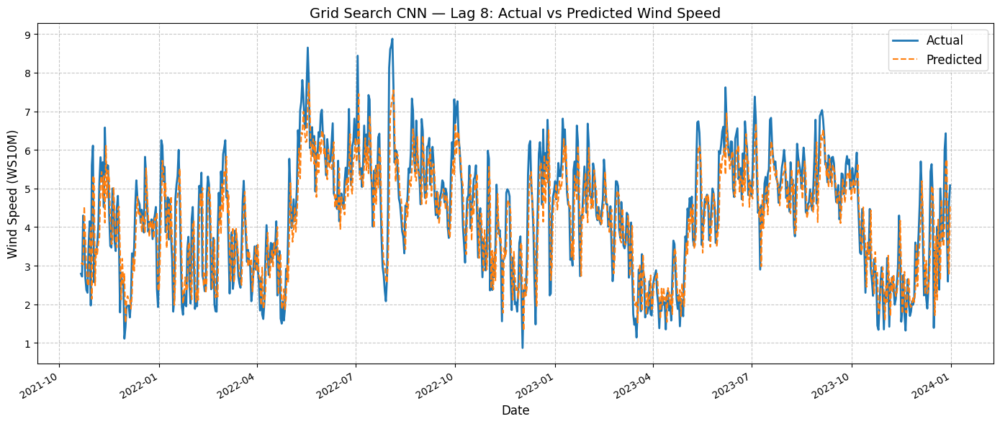


  Grid Search — Lag 9
  Testing 8 parameter combinations for lag 9
  Combination 1/8: filters=32, kernel=1, lr=0.001, epochs=20, batch=32
  New best — Val MSE: 0.0089 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0085 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0085 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0085 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0085 | Params: {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  Best Parameters (Lag 9): {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}
  Best Validation MSE        : 0.0085

*******************************************************
  Grid Search CNN — Lag 9
***************************************

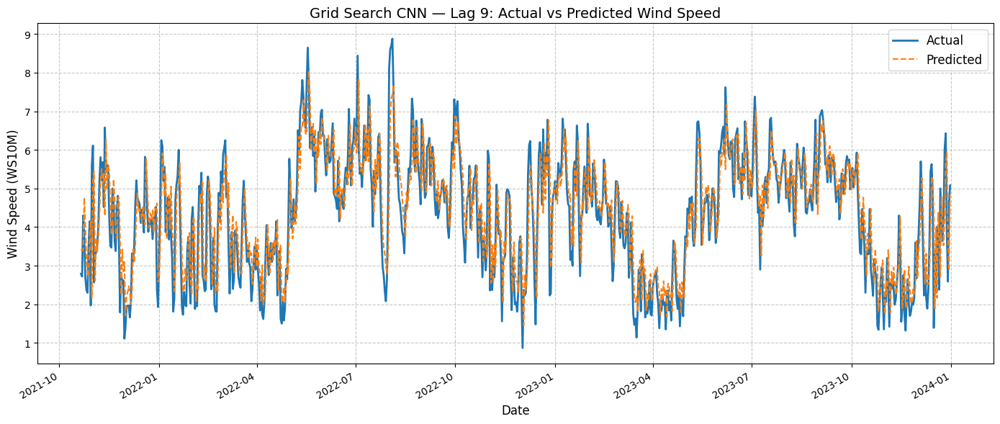


  Grid Search — Lag 10
  Testing 8 parameter combinations for lag 10
  Combination 1/8: filters=32, kernel=1, lr=0.001, epochs=20, batch=32
  New best — Val MSE: 0.0092 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0088 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  Best Parameters (Lag 10): {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}
  Best Validation MSE        : 0.0088

*******************************************************
  Grid Search CNN — Lag 10
*******************************************************
  MSE       : 0.738730
  RMSE      : 0.859494
  MAE       : 0.662125
  MAPE      : 18.824395 %
  R-squared : 0.693679
*******************************************************


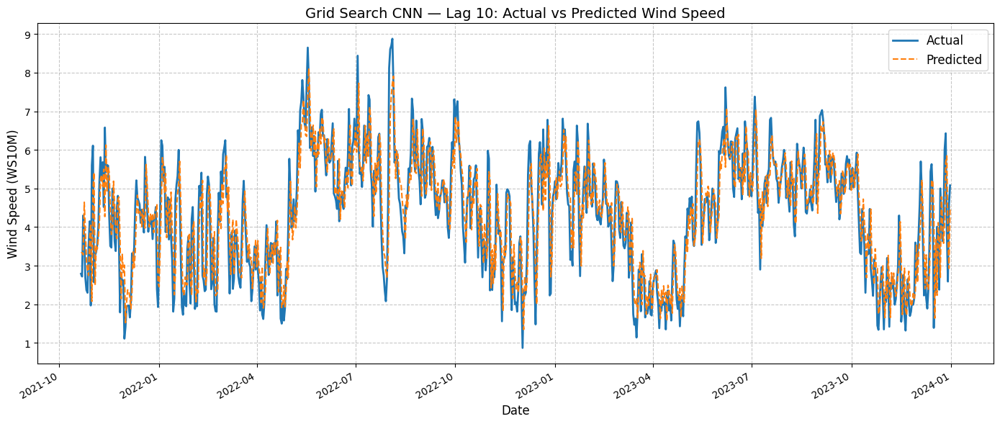


  Grid Search — Lag 11
  Testing 8 parameter combinations for lag 11
  Combination 1/8: filters=32, kernel=1, lr=0.001, epochs=20, batch=32
  New best — Val MSE: 0.0092 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0091 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0091 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0088 | Params: {'filters': 64, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  Best Parameters (Lag 11): {'filters': 64, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}
  Best Validation MSE        : 0.0088

*******************************************************
  Grid Search CNN — Lag 11
*******************************************************
  MSE       : 0.726370
  RMSE      : 0.852273
  MAE       : 0.655359
  MAPE      : 18.480621 %
  R

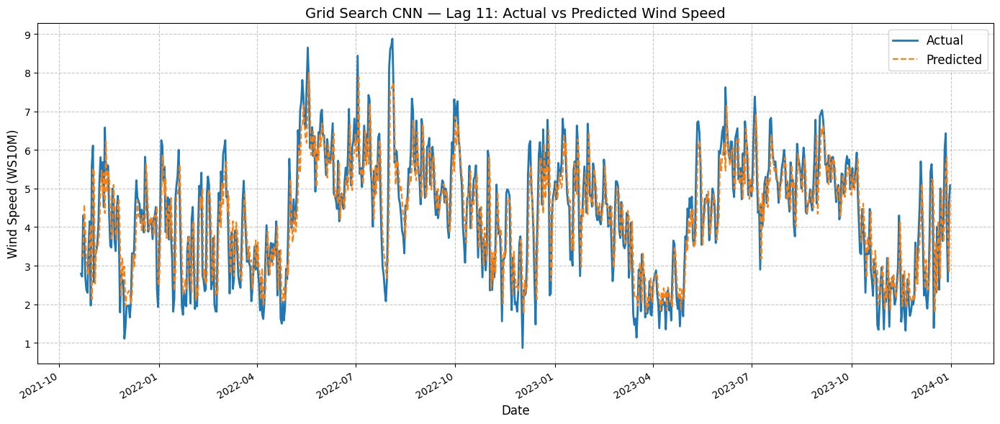


  Grid Search — Lag 12
  Testing 8 parameter combinations for lag 12
  Combination 1/8: filters=32, kernel=1, lr=0.001, epochs=20, batch=32
  New best — Val MSE: 0.0094 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0086 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}

  Best Parameters (Lag 12): {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}
  Best Validation MSE        : 0.0086

*******************************************************
  Grid Search CNN — Lag 12
*******************************************************
  MSE       : 0.766472
  RMSE      : 0.875484
  MAE       : 0.681138
  MAPE      : 19.811248 %
  R-squared : 0.682184
*******************************************************


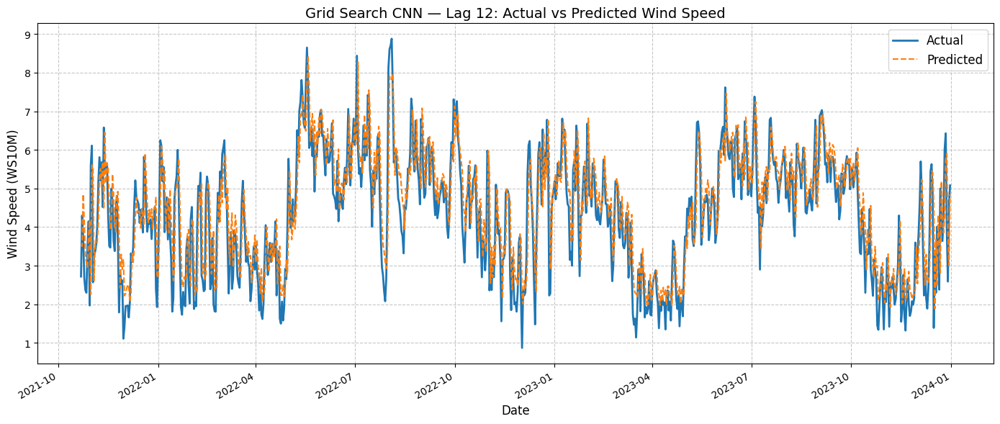


  Grid Search — Lag 13
  Testing 8 parameter combinations for lag 13
  Combination 1/8: filters=32, kernel=1, lr=0.001, epochs=20, batch=32
  New best — Val MSE: 0.0092 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0086 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}

  Best Parameters (Lag 13): {'filters': 32, 'kernel_size': 2, 'lr': 0.003, 'epochs': 20, 'batch_size': 32}
  Best Validation MSE        : 0.0086

*******************************************************
  Grid Search CNN — Lag 13
*******************************************************
  MSE       : 0.745569
  RMSE      : 0.863463
  MAE       : 0.665449
  MAPE      : 19.007690 %
  R-squared : 0.690851
*******************************************************


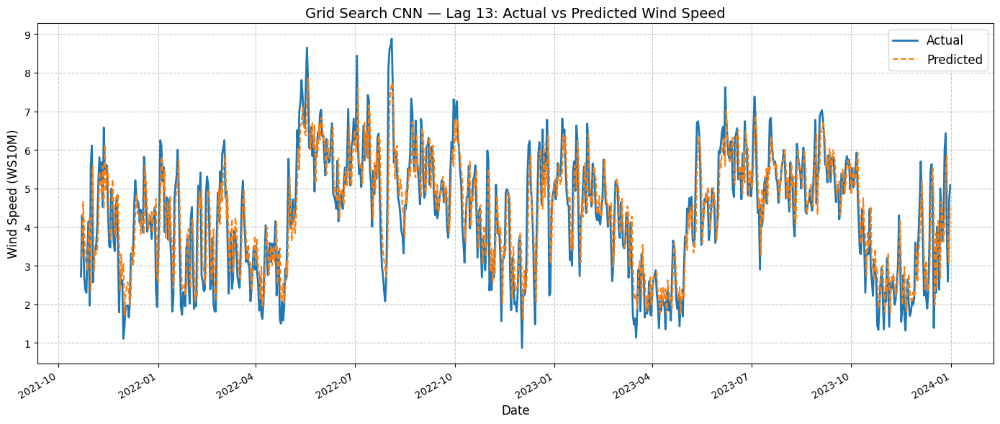


  Grid Search — Lag 14
  Testing 8 parameter combinations for lag 14
  Combination 1/8: filters=32, kernel=1, lr=0.001, epochs=20, batch=32
  New best — Val MSE: 0.0091 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0089 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0088 | Params: {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  Best Parameters (Lag 14): {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}
  Best Validation MSE        : 0.0088

*******************************************************
  Grid Search CNN — Lag 14
*******************************************************
  MSE       : 0.759802
  RMSE      : 0.871666
  MAE       : 0.675349
  MAPE      : 19.695089 %
  R-squared : 0.684949
*******************************************************


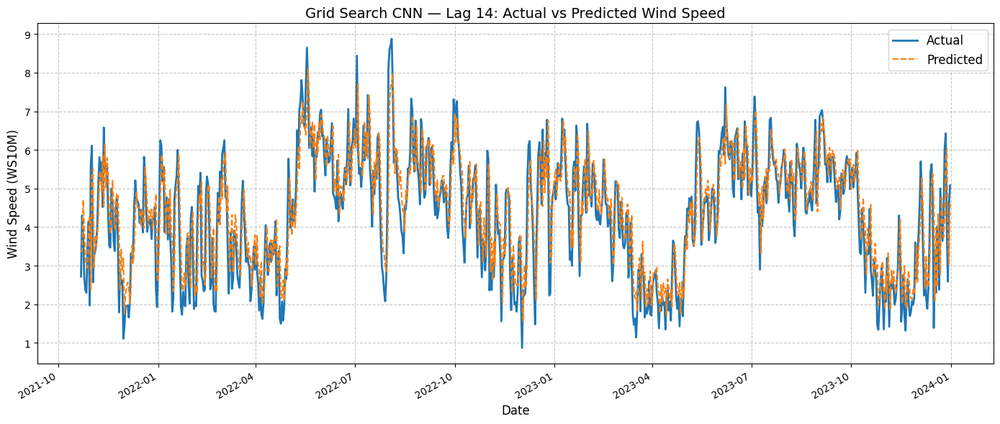


GRID SEARCH — SUMMARY ACROSS ALL LAGS
          mse      rmse       mae       mape        r2
lag                                                   
1    0.769021  0.876938  0.670340  18.819528  0.680725
2    0.783614  0.885219  0.678958  18.643154  0.675044
3    0.755323  0.869093  0.666443  18.707340  0.686775
4    0.758398  0.870861  0.671104  19.262045  0.685500
5    0.757788  0.870510  0.669475  18.667561  0.685754
6    0.757136  0.870136  0.665075  18.235011  0.686024
7    0.746766  0.864156  0.666918  19.368215  0.690347
8    0.750969  0.866584  0.667891  18.297898  0.688605
9    0.740570  0.860564  0.664279  19.205926  0.692916
10   0.738730  0.859494  0.662125  18.824395  0.693679
11   0.726370  0.852273  0.655359  18.480621  0.698805
12   0.766472  0.875484  0.681138  19.811248  0.682184
13   0.745569  0.863463  0.665449  19.007690  0.690851
14   0.759802  0.871666  0.675349  19.695089  0.684949

█████████████████████████████████████████████████████████████████
  ✦  OPTIMAL M

In [6]:


# ─────────────────────────────────────────────────────────────────────────────
# SECTION 7: GRID SEARCH — HYPERPARAMETERS × LAGS 1–14
# ─────────────────────────────────────────────────────────────────────────────
# For each lag (1–14), an exhaustive grid search is conducted over the
# hyperparameter space using TimeSeriesSplit CV on the training set only.
# kernel_size values that exceed the current lag are automatically excluded
# (a CNN kernel cannot be wider than the input sequence).

print("\n" + "=" * 70)
print("SECTION 7: GRID SEARCH HYPERPARAMETER TUNING")
print("=" * 70)

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

PARAM_GRID = {
    'filters':     [32, 64],
    'kernel_size': [1, 2],
    'lr':          [1e-3, 3e-3],
    'epochs':      [20],
    'batch_size':  [32]
}
grid_results = []

for lag in range(1, 15):
    print(f"\n{'=' * 50}")
    print(f"  Grid Search — Lag {lag}")
    print(f"{'=' * 50}")

    (X_train_cnn, X_test_cnn,
     y_train_scaled, y_test_scaled,
     y_test_inv, test_dates, scaler) = prepare_lag_data(lag)

    # Filter kernel sizes that are valid for this lag length
    valid_kernels = [k for k in PARAM_GRID['kernel_size'] if k <= lag]

    if not valid_kernels:
        print(f"  No valid kernel sizes for lag {lag}, skipping...")
        continue

    # Build list of all valid parameter combinations
    param_names  = ['filters', 'kernel_size', 'lr', 'epochs', 'batch_size']
    param_values = [
        PARAM_GRID['filters'],
        valid_kernels,
        PARAM_GRID['lr'],
        PARAM_GRID['epochs'],
        PARAM_GRID['batch_size']
    ]
    param_combinations = list(product(*param_values))
    total = len(param_combinations)

    print(f"  Testing {total} parameter combinations for lag {lag}")

    best_val_loss_grid = float('inf')
    best_params_grid   = None

    # Exhaustive grid search using TimeSeriesSplit CV on training data only
    for combo_idx, combo in enumerate(param_combinations):
        params = dict(zip(param_names, combo))
        print(
            f"  Combination {combo_idx + 1}/{total}: "
            f"filters={params['filters']}, kernel={params['kernel_size']}, "
            f"lr={params['lr']}, epochs={params['epochs']}, "
            f"batch={params['batch_size']}",
            end="\r"
        )

        mean_val = cross_validate_cnn(
            params['filters'], params['kernel_size'], params['lr'],
            params['batch_size'], params['epochs'],
            X_train_cnn, y_train_scaled, n_splits=3
        )

        if mean_val < best_val_loss_grid:
            best_val_loss_grid = mean_val
            best_params_grid   = params
            print(
                f"\n  New best — Val MSE: {best_val_loss_grid:.4f} "
                f"| Params: {best_params_grid}"
            )

    print(f"\n  Best Parameters (Lag {lag}): {best_params_grid}")
    print(f"  Best Validation MSE        : {best_val_loss_grid:.4f}")

    # Retrain final model on FULL training set with best parameters
    model_grid = build_cnn(
        best_params_grid['filters'],
        best_params_grid['kernel_size'],
        best_params_grid['lr'],
        input_shape=X_train_cnn.shape[1:]
    )
    model_grid.fit(
        X_train_cnn, y_train_scaled,
        epochs     = best_params_grid['epochs'],
        batch_size = best_params_grid['batch_size'],
        verbose    = 0
    )

    # Predict and inverse scale
    y_pred_scaled = model_grid.predict(X_test_cnn, verbose=0).flatten()
    y_pred_inv    = scaler.inverse_transform(
        y_pred_scaled.reshape(-1, 1)
    ).flatten()

    # Compute and print per-lag metrics
    m = compute_metrics(y_test_inv, y_pred_inv)
    print_metrics(m, f"Grid Search CNN — Lag {lag}")

    # Plot actual vs predicted with date axis
    plot_predictions(
        test_dates, y_test_inv, y_pred_inv,
        title=f"Grid Search CNN — Lag {lag}: Actual vs Predicted Wind Speed"
    )

    grid_results.append({'lag': lag, 'best_params': best_params_grid, **m})

# Identify optimal lag for Grid Search
grid_summary  = pd.DataFrame(grid_results).set_index('lag')
best_grid_lag = grid_summary['rmse'].idxmin()
best_grid_row = grid_results[best_grid_lag - 1]

print("\n" + "=" * 70)
print("GRID SEARCH — SUMMARY ACROSS ALL LAGS")
print("=" * 70)
print(grid_summary[['mse', 'rmse', 'mae', 'mape', 'r2']].round(6))

# ── Optimal model box ────────────────────────────────────────────────────────
print_optimal_model_box(
    method_name = "Grid Search CNN",
    optimal_lag = best_grid_lag,
    best_params = best_grid_row['best_params'],
    metrics     = {k: best_grid_row[k] for k in ['mse', 'rmse', 'mae', 'mape', 'r2']}
)



SECTION 8: RANDOMIZED SEARCH HYPERPARAMETER TUNING

  Randomized Search — Lag 1
  Trial 1/20: {'filters': 128, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 16}
  New best — Val MSE: 0.0091 | Params: {'filters': 128, 'kernel_size': 1, 'lr': 0.003, 'epochs': 20, 'batch_size': 16}

  New best — Val MSE: 0.0087 | Params: {'filters': 128, 'kernel_size': 1, 'lr': 0.003, 'epochs': 10, 'batch_size': 32}

  New best — Val MSE: 0.0087 | Params: {'filters': 64, 'kernel_size': 1, 'lr': 0.0003, 'epochs': 30, 'batch_size': 16}

  Best Parameters (Lag 1): {'filters': 64, 'kernel_size': 1, 'lr': 0.0003, 'epochs': 30, 'batch_size': 16}
  Best Validation MSE        : 0.0087

*******************************************************
  Randomized Search CNN — Lag 1
*******************************************************
  MSE       : 0.767228
  RMSE      : 0.875916
  MAE       : 0.669499
  MAPE      : 18.802688 %
  R-squared : 0.681469
*******************************************************


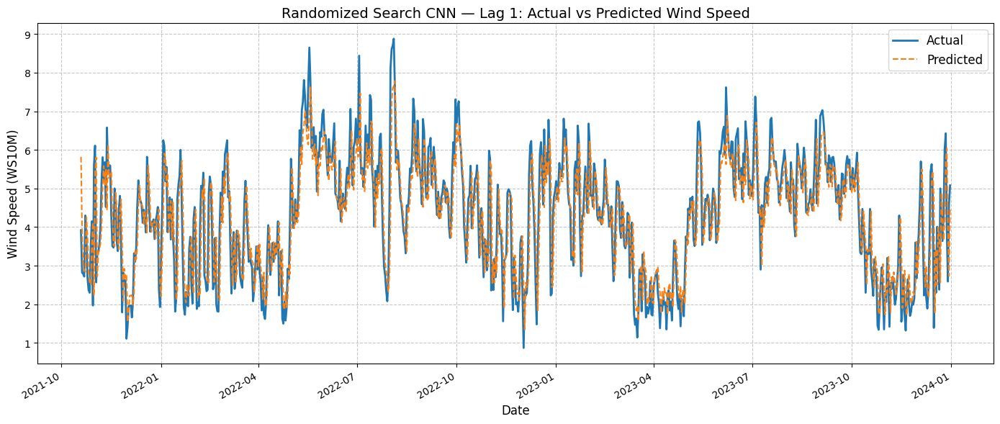


  Randomized Search — Lag 2
  Trial 1/20: {'filters': 96, 'kernel_size': 1, 'lr': 0.003, 'epochs': 30, 'batch_size': 32}
  New best — Val MSE: 0.0087 | Params: {'filters': 96, 'kernel_size': 1, 'lr': 0.003, 'epochs': 30, 'batch_size': 32}

  New best — Val MSE: 0.0087 | Params: {'filters': 128, 'kernel_size': 2, 'lr': 0.0003, 'epochs': 15, 'batch_size': 8}

  Best Parameters (Lag 2): {'filters': 128, 'kernel_size': 2, 'lr': 0.0003, 'epochs': 15, 'batch_size': 8}
  Best Validation MSE        : 0.0087

*******************************************************
  Randomized Search CNN — Lag 2
*******************************************************
  MSE       : 0.779399
  RMSE      : 0.882836
  MAE       : 0.678001
  MAPE      : 18.808177 %
  R-squared : 0.676791
*******************************************************


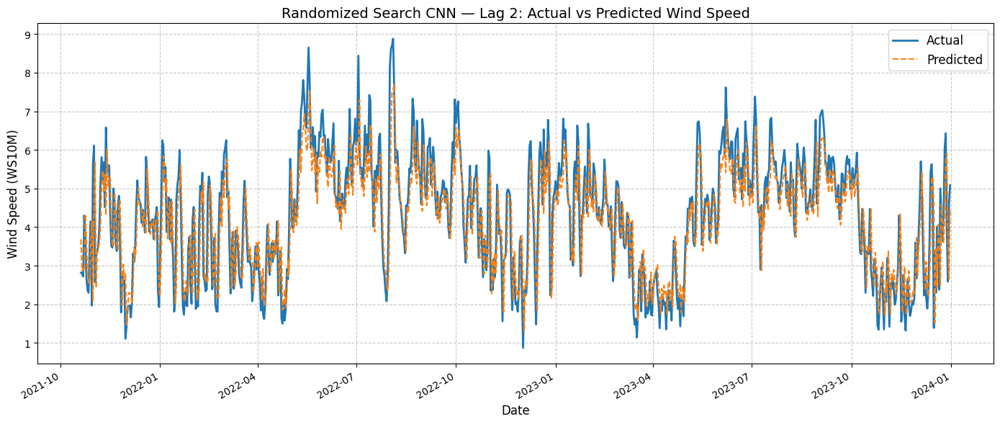


  Randomized Search — Lag 3
  Trial 1/20: {'filters': 32, 'kernel_size': 1, 'lr': 0.01, 'epochs': 10, 'batch_size': 8}
  New best — Val MSE: 0.0091 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.01, 'epochs': 10, 'batch_size': 8}

  New best — Val MSE: 0.0087 | Params: {'filters': 96, 'kernel_size': 1, 'lr': 0.0003, 'epochs': 25, 'batch_size': 8}

  New best — Val MSE: 0.0086 | Params: {'filters': 96, 'kernel_size': 3, 'lr': 0.003, 'epochs': 20, 'batch_size': 16}

  New best — Val MSE: 0.0086 | Params: {'filters': 96, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 32}

  New best — Val MSE: 0.0086 | Params: {'filters': 64, 'kernel_size': 3, 'lr': 0.003, 'epochs': 25, 'batch_size': 16}

  Best Parameters (Lag 3): {'filters': 64, 'kernel_size': 3, 'lr': 0.003, 'epochs': 25, 'batch_size': 16}
  Best Validation MSE        : 0.0086

*******************************************************
  Randomized Search CNN — Lag 3
******************************************************

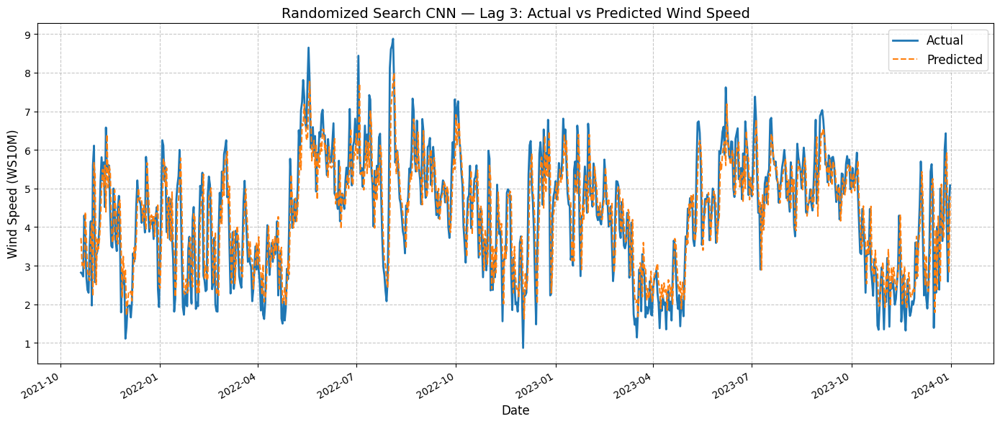


  Randomized Search — Lag 4
  Trial 1/20: {'filters': 96, 'kernel_size': 4, 'lr': 0.01, 'epochs': 25, 'batch_size': 16}
  New best — Val MSE: 0.0087 | Params: {'filters': 96, 'kernel_size': 4, 'lr': 0.01, 'epochs': 25, 'batch_size': 16}

  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 4, 'lr': 0.0003, 'epochs': 25, 'batch_size': 8}

  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.003, 'epochs': 20, 'batch_size': 8}

  New best — Val MSE: 0.0086 | Params: {'filters': 96, 'kernel_size': 3, 'lr': 0.001, 'epochs': 20, 'batch_size': 8}

  Best Parameters (Lag 4): {'filters': 96, 'kernel_size': 3, 'lr': 0.001, 'epochs': 20, 'batch_size': 8}
  Best Validation MSE        : 0.0086

*******************************************************
  Randomized Search CNN — Lag 4
*******************************************************
  MSE       : 0.763194
  RMSE      : 0.873610
  MAE       : 0.675435
  MAPE      : 19.601219 %
  R-squared : 0.683511


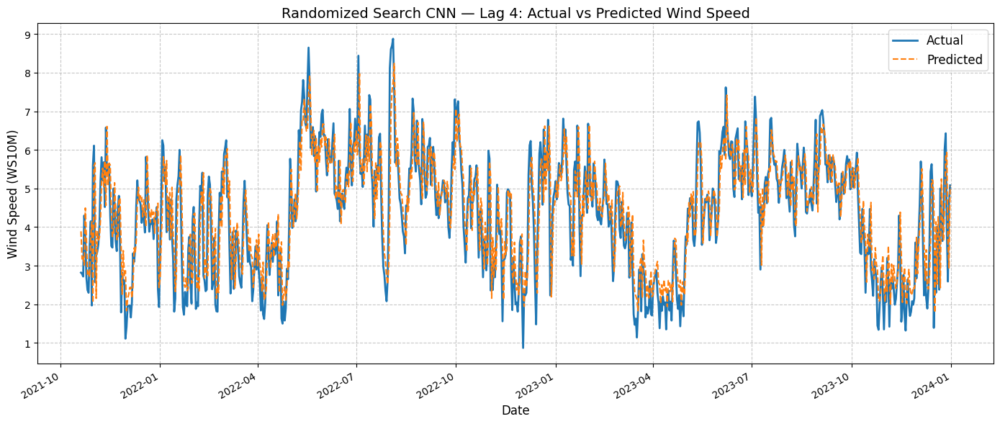


  Randomized Search — Lag 5
  Trial 1/20: {'filters': 128, 'kernel_size': 1, 'lr': 0.0003, 'epochs': 25, 'batch_size': 8}
  New best — Val MSE: 0.0086 | Params: {'filters': 128, 'kernel_size': 1, 'lr': 0.0003, 'epochs': 25, 'batch_size': 8}

  New best — Val MSE: 0.0086 | Params: {'filters': 96, 'kernel_size': 1, 'lr': 0.001, 'epochs': 30, 'batch_size': 32}

  New best — Val MSE: 0.0086 | Params: {'filters': 64, 'kernel_size': 4, 'lr': 0.0003, 'epochs': 30, 'batch_size': 16}

  New best — Val MSE: 0.0086 | Params: {'filters': 128, 'kernel_size': 4, 'lr': 0.0003, 'epochs': 20, 'batch_size': 8}

  Best Parameters (Lag 5): {'filters': 128, 'kernel_size': 4, 'lr': 0.0003, 'epochs': 20, 'batch_size': 8}
  Best Validation MSE        : 0.0086

*******************************************************
  Randomized Search CNN — Lag 5
*******************************************************
  MSE       : 0.757965
  RMSE      : 0.870612
  MAE       : 0.669535
  MAPE      : 19.100554 %
  R-squared :

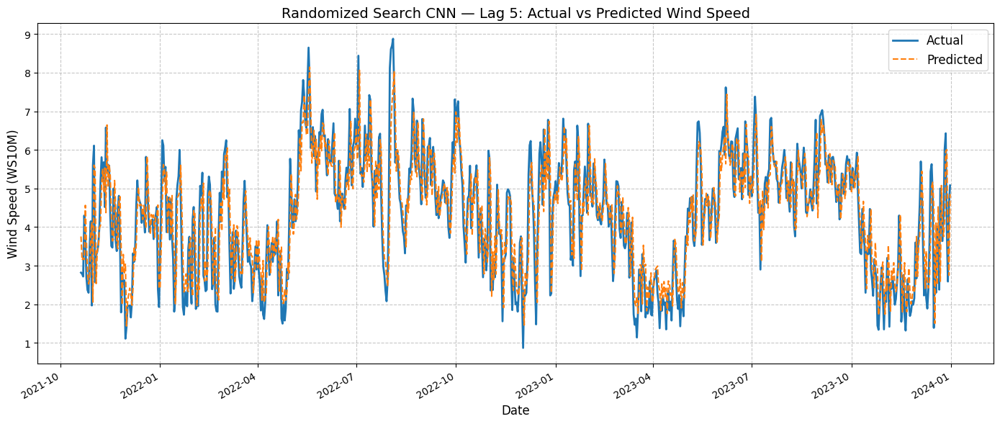


  Randomized Search — Lag 6
  Trial 1/20: {'filters': 96, 'kernel_size': 4, 'lr': 0.01, 'epochs': 30, 'batch_size': 16}
  New best — Val MSE: 0.0089 | Params: {'filters': 96, 'kernel_size': 4, 'lr': 0.01, 'epochs': 30, 'batch_size': 16}

  New best — Val MSE: 0.0087 | Params: {'filters': 128, 'kernel_size': 5, 'lr': 0.001, 'epochs': 30, 'batch_size': 8}

  New best — Val MSE: 0.0086 | Params: {'filters': 64, 'kernel_size': 5, 'lr': 0.0003, 'epochs': 25, 'batch_size': 8}

  Best Parameters (Lag 6): {'filters': 64, 'kernel_size': 5, 'lr': 0.0003, 'epochs': 25, 'batch_size': 8}
  Best Validation MSE        : 0.0086

*******************************************************
  Randomized Search CNN — Lag 6
*******************************************************
  MSE       : 0.754909
  RMSE      : 0.868855
  MAE       : 0.665501
  MAPE      : 18.505546 %
  R-squared : 0.686947
*******************************************************


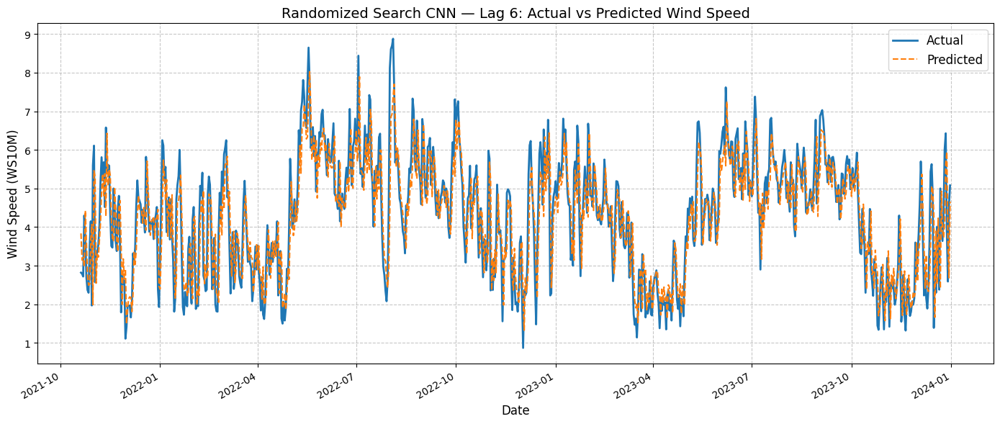


  Randomized Search — Lag 7
  Trial 1/20: {'filters': 128, 'kernel_size': 3, 'lr': 0.0003, 'epochs': 30, 'batch_size': 8}
  New best — Val MSE: 0.0087 | Params: {'filters': 128, 'kernel_size': 3, 'lr': 0.0003, 'epochs': 30, 'batch_size': 8}

  New best — Val MSE: 0.0086 | Params: {'filters': 128, 'kernel_size': 5, 'lr': 0.0003, 'epochs': 25, 'batch_size': 16}

  New best — Val MSE: 0.0086 | Params: {'filters': 64, 'kernel_size': 5, 'lr': 0.0003, 'epochs': 30, 'batch_size': 16}

  Best Parameters (Lag 7): {'filters': 64, 'kernel_size': 5, 'lr': 0.0003, 'epochs': 30, 'batch_size': 16}
  Best Validation MSE        : 0.0086

*******************************************************
  Randomized Search CNN — Lag 7
*******************************************************
  MSE       : 0.755407
  RMSE      : 0.869142
  MAE       : 0.671613
  MAPE      : 19.509781 %
  R-squared : 0.686764
*******************************************************


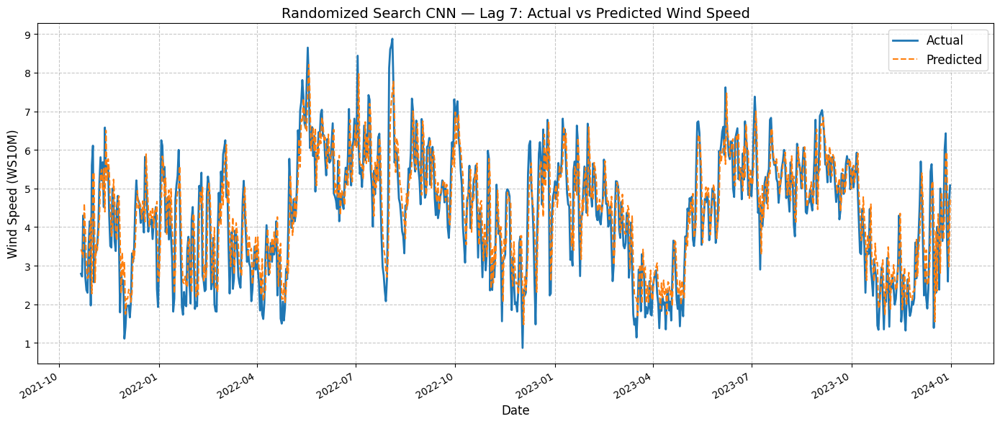


  Randomized Search — Lag 8
  Trial 1/20: {'filters': 32, 'kernel_size': 4, 'lr': 0.0003, 'epochs': 30, 'batch_size': 8}
  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 4, 'lr': 0.0003, 'epochs': 30, 'batch_size': 8}

  New best — Val MSE: 0.0086 | Params: {'filters': 128, 'kernel_size': 4, 'lr': 0.0003, 'epochs': 30, 'batch_size': 32}

  New best — Val MSE: 0.0086 | Params: {'filters': 128, 'kernel_size': 4, 'lr': 0.0003, 'epochs': 25, 'batch_size': 16}

  Best Parameters (Lag 8): {'filters': 128, 'kernel_size': 4, 'lr': 0.0003, 'epochs': 25, 'batch_size': 16}
  Best Validation MSE        : 0.0086

*******************************************************
  Randomized Search CNN — Lag 8
*******************************************************
  MSE       : 0.735553
  RMSE      : 0.857644
  MAE       : 0.662629
  MAPE      : 18.743887 %
  R-squared : 0.694997
*******************************************************


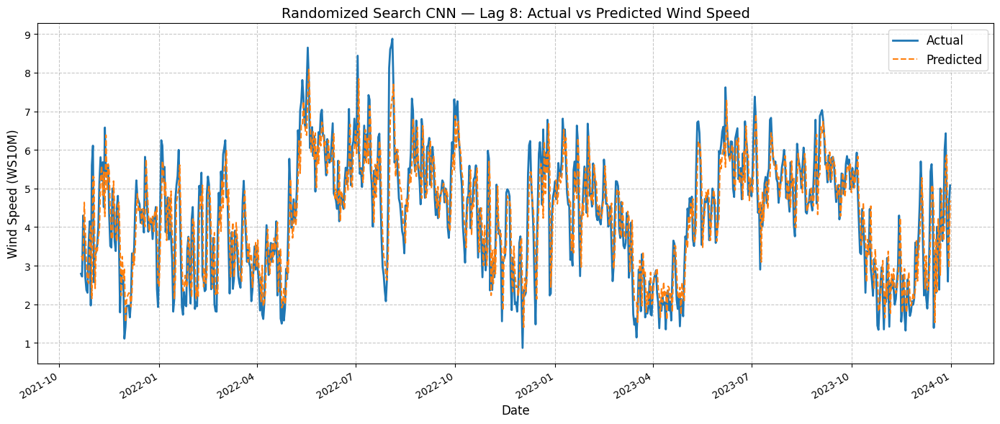


  Randomized Search — Lag 9
  Trial 1/20: {'filters': 128, 'kernel_size': 2, 'lr': 0.0003, 'epochs': 30, 'batch_size': 16}
  New best — Val MSE: 0.0084 | Params: {'filters': 128, 'kernel_size': 2, 'lr': 0.0003, 'epochs': 30, 'batch_size': 16}

  Best Parameters (Lag 9): {'filters': 128, 'kernel_size': 2, 'lr': 0.0003, 'epochs': 30, 'batch_size': 16}
  Best Validation MSE        : 0.0084

*******************************************************
  Randomized Search CNN — Lag 9
*******************************************************
  MSE       : 0.733334
  RMSE      : 0.856349
  MAE       : 0.659951
  MAPE      : 18.840506 %
  R-squared : 0.695917
*******************************************************


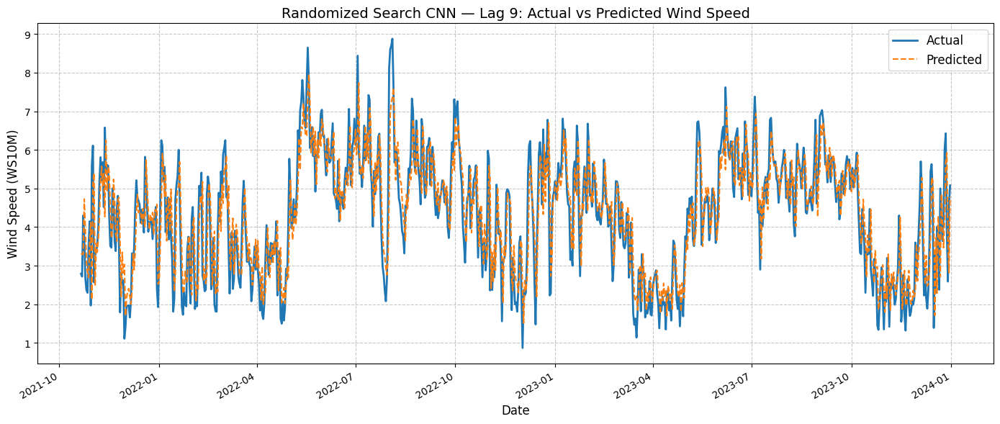


  Randomized Search — Lag 10
  Trial 1/20: {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 10, 'batch_size': 16}
  New best — Val MSE: 0.0087 | Params: {'filters': 64, 'kernel_size': 2, 'lr': 0.001, 'epochs': 10, 'batch_size': 16}

  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 15, 'batch_size': 16}

  Best Parameters (Lag 10): {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 15, 'batch_size': 16}
  Best Validation MSE        : 0.0087

*******************************************************
  Randomized Search CNN — Lag 10
*******************************************************
  MSE       : 0.741121
  RMSE      : 0.860884
  MAE       : 0.660394
  MAPE      : 18.250009 %
  R-squared : 0.692688
*******************************************************


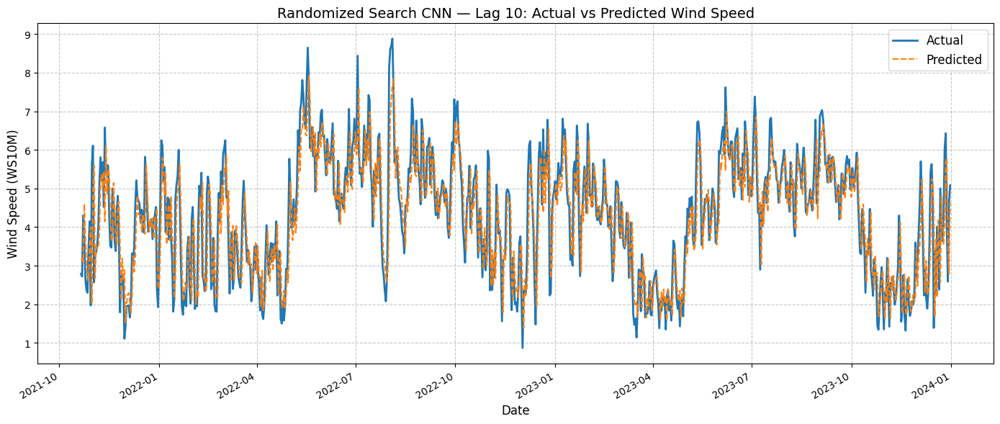


  Randomized Search — Lag 11
  Trial 1/20: {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 16}
  New best — Val MSE: 0.0090 | Params: {'filters': 32, 'kernel_size': 2, 'lr': 0.001, 'epochs': 20, 'batch_size': 16}

  New best — Val MSE: 0.0090 | Params: {'filters': 64, 'kernel_size': 4, 'lr': 0.001, 'epochs': 30, 'batch_size': 16}

  New best — Val MSE: 0.0090 | Params: {'filters': 64, 'kernel_size': 3, 'lr': 0.001, 'epochs': 25, 'batch_size': 16}

  New best — Val MSE: 0.0088 | Params: {'filters': 64, 'kernel_size': 5, 'lr': 0.001, 'epochs': 15, 'batch_size': 8}

  New best — Val MSE: 0.0086 | Params: {'filters': 64, 'kernel_size': 4, 'lr': 0.003, 'epochs': 15, 'batch_size': 16}

  Best Parameters (Lag 11): {'filters': 64, 'kernel_size': 4, 'lr': 0.003, 'epochs': 15, 'batch_size': 16}
  Best Validation MSE        : 0.0086

*******************************************************
  Randomized Search CNN — Lag 11
************************************************

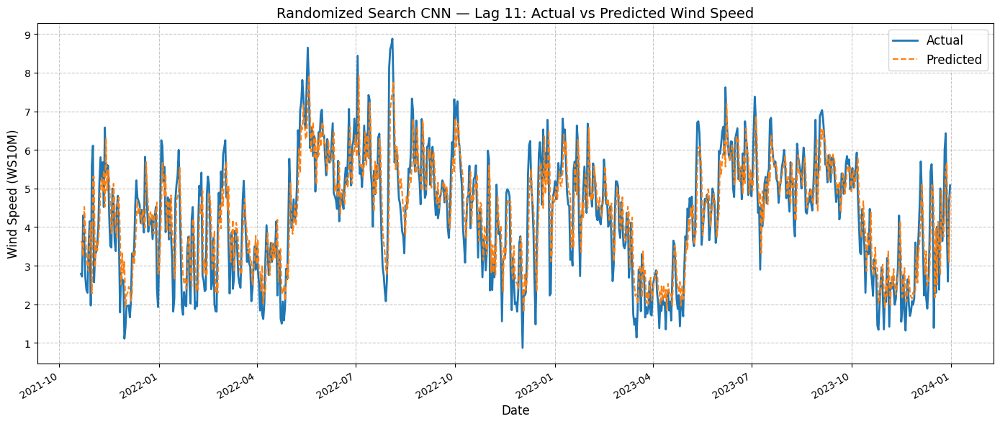


  Randomized Search — Lag 12
  Trial 1/20: {'filters': 32, 'kernel_size': 5, 'lr': 0.001, 'epochs': 25, 'batch_size': 8}
  New best — Val MSE: 0.0086 | Params: {'filters': 32, 'kernel_size': 5, 'lr': 0.001, 'epochs': 25, 'batch_size': 8}

  New best — Val MSE: 0.0086 | Params: {'filters': 64, 'kernel_size': 1, 'lr': 0.01, 'epochs': 15, 'batch_size': 32}

  New best — Val MSE: 0.0085 | Params: {'filters': 64, 'kernel_size': 2, 'lr': 0.0003, 'epochs': 25, 'batch_size': 16}

  Best Parameters (Lag 12): {'filters': 64, 'kernel_size': 2, 'lr': 0.0003, 'epochs': 25, 'batch_size': 16}
  Best Validation MSE        : 0.0085

*******************************************************
  Randomized Search CNN — Lag 12
*******************************************************
  MSE       : 0.739928
  RMSE      : 0.860191
  MAE       : 0.663235
  MAPE      : 19.046491 %
  R-squared : 0.693190
*******************************************************


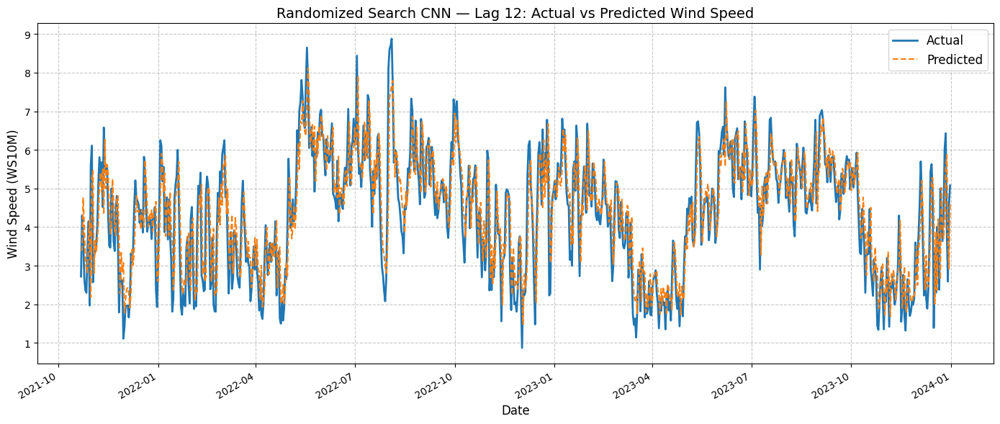


  Randomized Search — Lag 13
  Trial 1/20: {'filters': 32, 'kernel_size': 3, 'lr': 0.01, 'epochs': 25, 'batch_size': 8}
  New best — Val MSE: 0.0096 | Params: {'filters': 32, 'kernel_size': 3, 'lr': 0.01, 'epochs': 25, 'batch_size': 8}

  New best — Val MSE: 0.0090 | Params: {'filters': 96, 'kernel_size': 3, 'lr': 0.0003, 'epochs': 15, 'batch_size': 8}

  New best — Val MSE: 0.0089 | Params: {'filters': 128, 'kernel_size': 2, 'lr': 0.0003, 'epochs': 25, 'batch_size': 8}

  New best — Val MSE: 0.0089 | Params: {'filters': 32, 'kernel_size': 3, 'lr': 0.01, 'epochs': 20, 'batch_size': 16}

  New best — Val MSE: 0.0088 | Params: {'filters': 96, 'kernel_size': 2, 'lr': 0.0003, 'epochs': 30, 'batch_size': 8}

  New best — Val MSE: 0.0087 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 30, 'batch_size': 8}

  Best Parameters (Lag 13): {'filters': 32, 'kernel_size': 1, 'lr': 0.003, 'epochs': 30, 'batch_size': 8}
  Best Validation MSE        : 0.0087

***********************

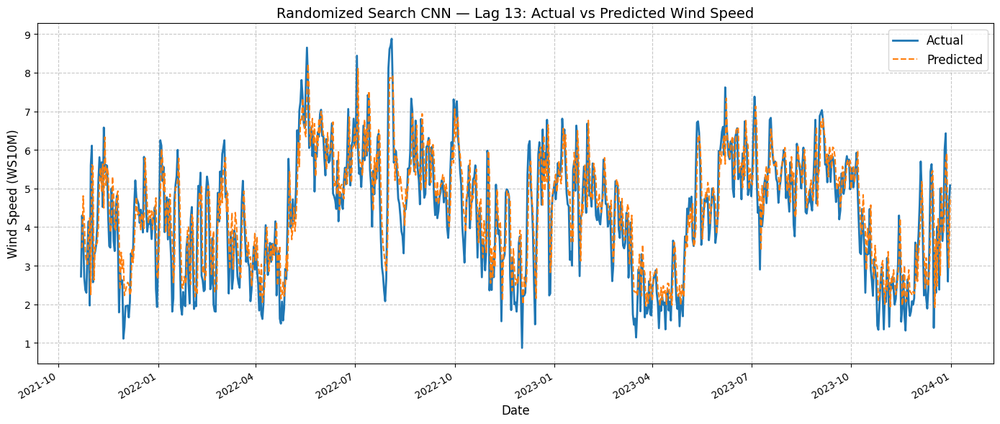


  Randomized Search — Lag 14
  Trial 1/20: {'filters': 32, 'kernel_size': 5, 'lr': 0.001, 'epochs': 10, 'batch_size': 8}
  New best — Val MSE: 0.0092 | Params: {'filters': 32, 'kernel_size': 5, 'lr': 0.001, 'epochs': 10, 'batch_size': 8}

  New best — Val MSE: 0.0089 | Params: {'filters': 32, 'kernel_size': 1, 'lr': 0.0003, 'epochs': 30, 'batch_size': 8}

  New best — Val MSE: 0.0089 | Params: {'filters': 128, 'kernel_size': 2, 'lr': 0.0003, 'epochs': 30, 'batch_size': 16}

  New best — Val MSE: 0.0088 | Params: {'filters': 128, 'kernel_size': 2, 'lr': 0.0001, 'epochs': 25, 'batch_size': 8}

  Best Parameters (Lag 14): {'filters': 128, 'kernel_size': 2, 'lr': 0.0001, 'epochs': 25, 'batch_size': 8}
  Best Validation MSE        : 0.0088

*******************************************************
  Randomized Search CNN — Lag 14
*******************************************************
  MSE       : 0.747391
  RMSE      : 0.864518
  MAE       : 0.669507
  MAPE      : 19.451457 %
  R-squared :

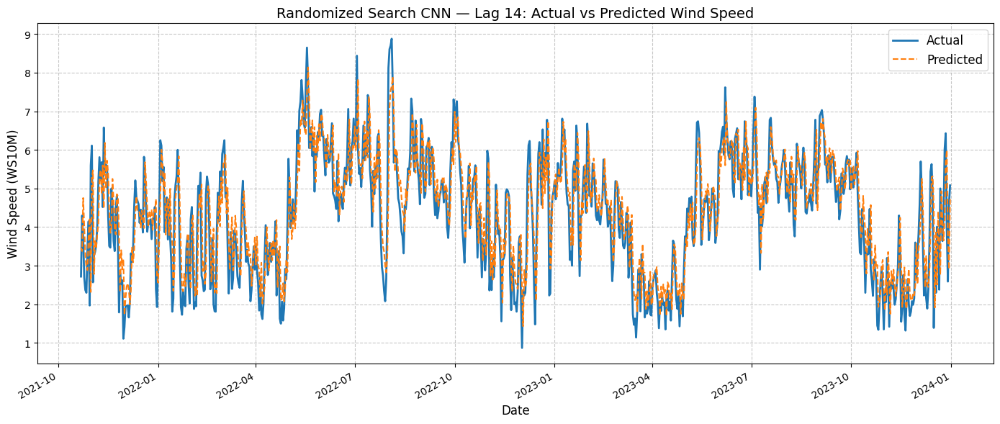


RANDOMIZED SEARCH — SUMMARY ACROSS ALL LAGS
          mse      rmse       mae       mape        r2
lag                                                   
1    0.767228  0.875916  0.669499  18.802688  0.681469
2    0.779399  0.882836  0.678001  18.808177  0.676791
3    0.748084  0.864919  0.666021  19.024385  0.689777
4    0.763194  0.873610  0.675435  19.601219  0.683511
5    0.757965  0.870612  0.669535  19.100554  0.685680
6    0.754909  0.868855  0.665501  18.505546  0.686947
7    0.755407  0.869142  0.671613  19.509781  0.686764
8    0.735553  0.857644  0.662629  18.743887  0.694997
9    0.733334  0.856349  0.659951  18.840506  0.695917
10   0.741121  0.860884  0.660394  18.250009  0.692688
11   0.732509  0.855867  0.659686  19.093261  0.696259
12   0.739928  0.860191  0.663235  19.046491  0.693190
13   0.754626  0.868692  0.673827  19.699031  0.687096
14   0.747391  0.864518  0.669507  19.451457  0.690096

█████████████████████████████████████████████████████████████████
  ✦  OPT

In [7]:
# ─────────────────────────────────────────────────────────────────────────────
# SECTION 8: RANDOMIZED SEARCH — HYPERPARAMETERS × LAGS 1–14
# ─────────────────────────────────────────────────────────────────────────────
# For each lag (1–14), a fixed number of random hyperparameter combinations
# are evaluated using TimeSeriesSplit CV on the training set only.
# kernel_size values that exceed the current lag are excluded per-iteration.

print("\n" + "=" * 70)
print("SECTION 8: RANDOMIZED SEARCH HYPERPARAMETER TUNING")
print("=" * 70)

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Hyperparameter search space for random sampling
PARAM_SPACE = {
    'filters':     [32, 64, 96, 128],
    'kernel_size': [1, 2, 3, 4, 5],   # Filtered per lag below
    'lr':          [1e-4, 3e-4, 1e-3, 3e-3, 1e-2],
    'epochs':      [10, 15, 20, 25, 30],
    'batch_size':  [8, 16, 32]
}

# Number of random trials per lag
N_TRIALS_RANDOM = 20

random_results = []

for lag in range(1, 15):
    print(f"\n{'=' * 50}")
    print(f"  Randomized Search — Lag {lag}")
    print(f"{'=' * 50}")

    (X_train_cnn, X_test_cnn,
     y_train_scaled, y_test_scaled,
     y_test_inv, test_dates, scaler) = prepare_lag_data(lag)

    # Valid kernel sizes for this lag length
    valid_kernels = [k for k in PARAM_SPACE['kernel_size'] if k <= lag]

    best_val_loss_random = float('inf')
    best_params_random   = None

    # Random search — each trial uses a reproducible trial-specific seed
    for trial_num in range(N_TRIALS_RANDOM):
        # Trial-specific seed ensures reproducibility of each individual draw
        trial_seed = SEED + lag * 100 + trial_num
        rng        = random.Random(trial_seed)

        # Sample random hyperparameters
        params = {
            'filters':     rng.choice(PARAM_SPACE['filters']),
            'kernel_size': rng.choice(valid_kernels),
            'lr':          rng.choice(PARAM_SPACE['lr']),
            'epochs':      rng.choice(PARAM_SPACE['epochs']),
            'batch_size':  rng.choice(PARAM_SPACE['batch_size'])
        }

        print(f"  Trial {trial_num + 1}/{N_TRIALS_RANDOM}: {params}", end="\r")

        # Evaluate using TimeSeriesSplit CV on training data only
        mean_val = cross_validate_cnn(
            params['filters'], params['kernel_size'], params['lr'],
            params['batch_size'], params['epochs'],
            X_train_cnn, y_train_scaled, n_splits=3
        )

        if mean_val < best_val_loss_random:
            best_val_loss_random = mean_val
            best_params_random   = params
            print(
                f"\n  New best — Val MSE: {best_val_loss_random:.4f} "
                f"| Params: {best_params_random}"
            )

    print(f"\n  Best Parameters (Lag {lag}): {best_params_random}")
    print(f"  Best Validation MSE        : {best_val_loss_random:.4f}")

    # Retrain final model on FULL training set with best parameters
    model_random = build_cnn(
        best_params_random['filters'],
        best_params_random['kernel_size'],
        best_params_random['lr'],
        input_shape=X_train_cnn.shape[1:]
    )
    model_random.fit(
        X_train_cnn, y_train_scaled,
        epochs     = best_params_random['epochs'],
        batch_size = best_params_random['batch_size'],
        verbose    = 0
    )

    # Predict and inverse scale
    y_pred_scaled = model_random.predict(X_test_cnn, verbose=0).flatten()
    y_pred_inv    = scaler.inverse_transform(
        y_pred_scaled.reshape(-1, 1)
    ).flatten()

    # Compute and print per-lag metrics
    m = compute_metrics(y_test_inv, y_pred_inv)
    print_metrics(m, f"Randomized Search CNN — Lag {lag}")

    # Plot actual vs predicted with date axis
    plot_predictions(
        test_dates, y_test_inv, y_pred_inv,
        title=f"Randomized Search CNN — Lag {lag}: Actual vs Predicted Wind Speed"
    )

    random_results.append({'lag': lag, 'best_params': best_params_random, **m})

# Identify optimal lag for Randomized Search
random_summary  = pd.DataFrame(random_results).set_index('lag')
best_random_lag = random_summary['rmse'].idxmin()
best_random_row = random_results[best_random_lag - 1]

print("\n" + "=" * 70)
print("RANDOMIZED SEARCH — SUMMARY ACROSS ALL LAGS")
print("=" * 70)
print(random_summary[['mse', 'rmse', 'mae', 'mape', 'r2']].round(6))

# ── Optimal model box ────────────────────────────────────────────────────────
print_optimal_model_box(
    method_name = "Randomized Search CNN",
    optimal_lag = best_random_lag,
    best_params = best_random_row['best_params'],
    metrics     = {k: best_random_row[k] for k in ['mse', 'rmse', 'mae', 'mape', 'r2']}
)



SECTION 9: OPTUNA BAYESIAN OPTIMISATION

→ Optimal Lag (Optuna)  : 11
  Best Params           : {'filters': 128, 'kernel_size': 3, 'lr': 0.0001471495409202874, 'epochs': 48, 'batch_size': 16}
  Best Validation MSE   : 0.008506
Epoch 1/48
201/201 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0709
Epoch 2/48
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0160
Epoch 3/48
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0128
Epoch 4/48
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0110
Epoch 5/48
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0099
Epoch 6/48
201/201 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0093
Epoch 7/48
201/201 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0089
Epoch 8/48
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0087
Epoch 9/48
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0085
Epoch 10/48
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0084
Epoch 11/48
201/201 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0083
Epoch 12/48
201/201 ━━━━━━━━━━━━━

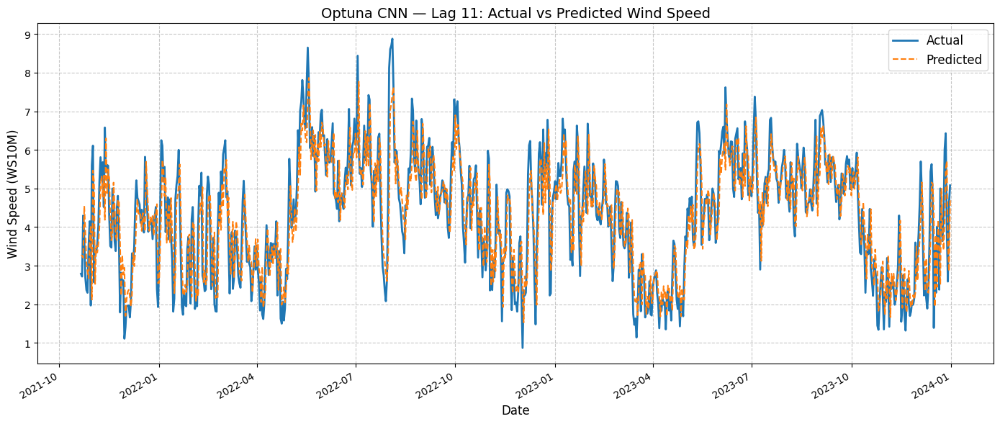


█████████████████████████████████████████████████████████████████
  ✦  OPTIMAL MODEL SUMMARY — OPTUNA CNN
█████████████████████████████████████████████████████████████████
  Optimal Lag (Window Size) : 11
  ─────────────────────────────────────────────────────────────
  Hyperparameters:
    filters                : 128
    kernel_size            : 3
    lr                     : 0.0001471495409202874
    epochs                 : 48
    batch_size             : 16
  ─────────────────────────────────────────────────────────────
  Test Set Performance:
    MSE                    : 0.734412
    RMSE                   : 0.856978
    MAE                    : 0.659827
    MAPE                   : 18.556994 %
    R-squared              : 0.695470
█████████████████████████████████████████████████████████████████



In [6]:

# ─────────────────────────────────────────────────────────────────────────────
# SECTION 9: OPTUNA BAYESIAN HYPERPARAMETER OPTIMISATION
# ─────────────────────────────────────────────────────────────────────────────
# Optuna jointly optimises both the lag length (1–14) and the CNN
# hyperparameters in a single study. The objective uses TimeSeriesSplit CV
# exclusively on the training portion. The test set is NEVER accessed here.

print("\n" + "=" * 70)
print("SECTION 9: OPTUNA BAYESIAN OPTIMISATION")
print("=" * 70)

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)


def objective_optuna(trial):
    """
    Optuna objective: jointly optimises lag length and CNN hyperparameters.
    Evaluated using TimeSeriesSplit CV on the training set only.
    The test set is NEVER accessed inside this function.
    """
    # Suggest lag length as part of the optimisation
    lag = trial.suggest_int('lag', 1, 14)

    # Suggest CNN hyperparameters
    filters     = trial.suggest_categorical('filters',    [32, 64, 96, 128])
    # kernel_size must not exceed the lag (sequence length)
    kernel_size = trial.suggest_int('kernel_size', 1, min(3, lag))
    lr          = trial.suggest_float('lr',    1e-4, 1e-2, log=True)
    epochs      = trial.suggest_int('epochs',  10,   50)
    batch_size  = trial.suggest_categorical('batch_size', [8, 16, 32])

    # Prepare data for the suggested lag (training portion only)
    (X_train_cnn, _, y_train_scaled, _, _, _, _) = prepare_lag_data(lag)

    # Cross-validate on training data — test set is never touched
    return cross_validate_cnn(
        filters, kernel_size, lr, batch_size, epochs,
        X_train_cnn, y_train_scaled, n_splits=3
    )


# Run Optuna study — minimise validation MSE on training data only
study = optuna.create_study(
    direction = 'minimize',
    sampler   = TPESampler(seed=SEED)
)
study.optimize(objective_optuna, n_trials=50)

# Extract best lag and hyperparameters
best_trial_params  = dict(study.best_trial.params)
best_lag_optuna    = best_trial_params.pop('lag')    # Remove lag from params dict
best_params_optuna = best_trial_params

print(f"\n→ Optimal Lag (Optuna)  : {best_lag_optuna}")
print(f"  Best Params           : {best_params_optuna}")
print(f"  Best Validation MSE   : {study.best_trial.value:.6f}")

# Prepare data for the optimal lag
(X_train_cnn, X_test_cnn,
 y_train_scaled, y_test_scaled,
 y_test_inv, test_dates, scaler) = prepare_lag_data(best_lag_optuna)

# Retrain the final model on the FULL training set with Optuna best parameters
model_optuna = build_cnn(
    best_params_optuna['filters'],
    best_params_optuna['kernel_size'],
    best_params_optuna['lr'],
    input_shape=X_train_cnn.shape[1:]
)
model_optuna.fit(
    X_train_cnn, y_train_scaled,
    epochs     = best_params_optuna['epochs'],
    batch_size = best_params_optuna['batch_size'],
    verbose    = 1
)

# Predict and inverse scale
y_pred_scaled_optuna = model_optuna.predict(X_test_cnn, verbose=0).flatten()
y_pred_inv_optuna    = scaler.inverse_transform(
    y_pred_scaled_optuna.reshape(-1, 1)
).flatten()

# Compute and print metrics
optuna_metrics = compute_metrics(y_test_inv, y_pred_inv_optuna)
print_metrics(optuna_metrics, f"Optuna CNN — Best Lag {best_lag_optuna}")

# Plot actual vs predicted with date axis
plot_predictions(
    test_dates, y_test_inv, y_pred_inv_optuna,
    title=f"Optuna CNN — Lag {best_lag_optuna}: Actual vs Predicted Wind Speed"
)

# ── Optimal model box ────────────────────────────────────────────────────────
print_optimal_model_box(
    method_name = "Optuna CNN",
    optimal_lag = best_lag_optuna,
    best_params = best_params_optuna,
    metrics     = optuna_metrics
)

In [ ]:







# ─────────────────────────────────────────────────────────────────────────────
# SECTION 10: FINAL COMPARATIVE RESULTS TABLE
# ─────────────────────────────────────────────────────────────────────────────
# Each method is represented by its optimal lag and corresponding test metrics.

print("\n" + "=" * 70)
print("SECTION 10: FINAL COMPARATIVE RESULTS")
print("=" * 70)

grid_best   = {k: best_grid_row[k]   for k in ['mse', 'rmse', 'mae', 'mape', 'r2']}
random_best = {k: best_random_row[k] for k in ['mse', 'rmse', 'mae', 'mape', 'r2']}

comparison_df = pd.DataFrame({
    "Method":        ["Original Model",      "Grid Search",
                      "Randomized Search",   "Optuna"],
    "Optimal Lag":   [best_orig_lag,          best_grid_lag,
                      best_random_lag,        best_lag_optuna],
    "Test MSE":      [best_orig_row['mse'],   grid_best['mse'],
                      random_best['mse'],     optuna_metrics['mse']],
    "Test RMSE":     [best_orig_row['rmse'],  grid_best['rmse'],
                      random_best['rmse'],    optuna_metrics['rmse']],
    "Test MAE":      [best_orig_row['mae'],   grid_best['mae'],
                      random_best['mae'],     optuna_metrics['mae']],
    "Test MAPE (%)": [best_orig_row['mape'],  grid_best['mape'],
                      random_best['mape'],    optuna_metrics['mape']],
    "Test R²":       [best_orig_row['r2'],    grid_best['r2'],
                      random_best['r2'],      optuna_metrics['r2']],
})

print("\nOptimal Lag and Test Set Performance by Method:")
print(comparison_df.to_string(index=False))

# Identify the overall best method by Test RMSE
best_method_idx = comparison_df['Test RMSE'].idxmin()
best_method_row = comparison_df.iloc[best_method_idx]

print(f"\n{'=' * 70}")
print(f"  OVERALL BEST METHOD  : {best_method_row['Method']}")
print(f"  Optimal Lag          : {best_method_row['Optimal Lag']}")
print(f"  Test MSE             : {best_method_row['Test MSE']:.6f}")
print(f"  Test RMSE            : {best_method_row['Test RMSE']:.6f}")
print(f"  Test MAE             : {best_method_row['Test MAE']:.6f}")
print(f"  Test MAPE            : {best_method_row['Test MAPE (%)']:.6f} %")
print(f"  Test R²              : {best_method_row['Test R²']:.6f}")
print(f"{'=' * 70}")

# Save the comparison table to CSV
comparison_df.to_csv("CNN_LagOptimisation_Results.csv", index=False)
print("\nResults saved to CNN_LagOptimisation_Results.csv")